(2200, 1700) <class 'numpy.ndarray'>


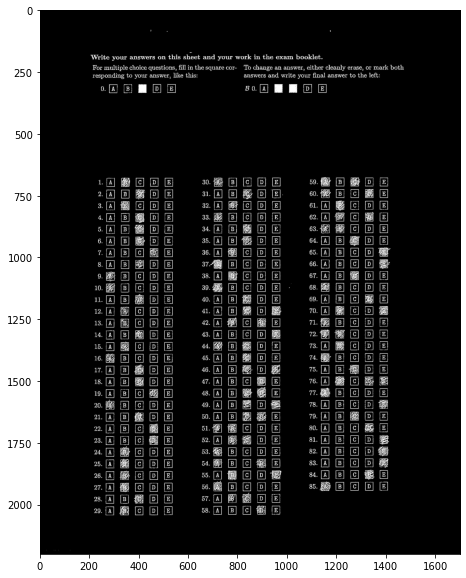

In [3]:
from PIL import Image, ImageFilter
import random
import math, sys, random, imageio, cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import warnings
from Convolution_preprocessing import *
from Edge_detection import *
warnings.filterwarnings('ignore')

image = np.array(imageio.imread('example.jpg',as_gray=True))
norm_img = np.abs(image - 255.)
print(image.shape, type(image))
plt.figure(figsize=(15,10))
plt.imshow(norm_img, cmap='gray')

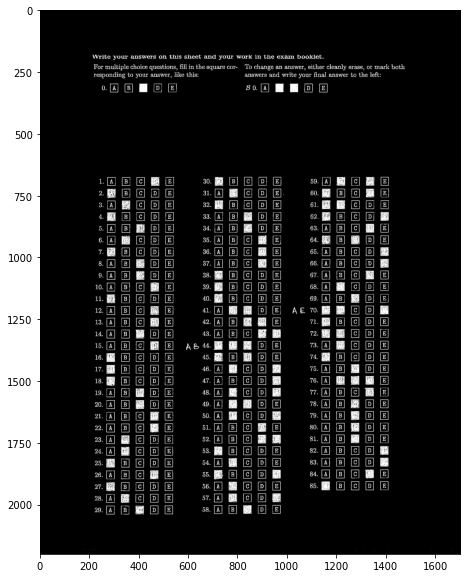

In [325]:
plt.figure(figsize=(15,10))
plt.imshow(t, cmap='gray')

In [341]:
ia = np.array(imageio.imread('image3.jpg',as_gray=True))
t = np.abs(ia - 255.)

In [343]:
best_verti_iter[10]

702

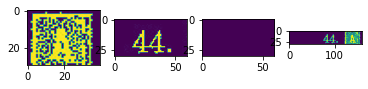

In [349]:
gap = t[1340:1370,700:740]
gap2 = t[1340:1370,640:700]
gap3 = t[1340:1370,580:640]
gap4 = t[1340:1370,580:740]
plt.subplot(1, 4, 1)
plt.imshow(gap)
plt.subplot(1, 4, 2)
plt.imshow(gap2)
plt.subplot(1, 4, 3)
plt.imshow(gap3)
plt.subplot(1, 4, 4)
plt.imshow(gap4)

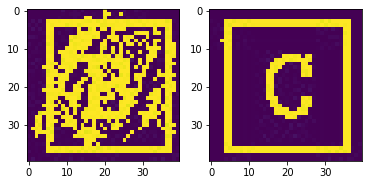

In [167]:
patch = t[2005:2045,320:360]
patch2 = t[2005:2045,380:420]
plt.subplot(1, 2, 1)
plt.imshow(patch)
plt.subplot(1, 2, 2)
plt.imshow(patch2)

In [28]:
np.sum(patch), np.sum(patch)/2, np.sum(patch2)

(189972.0, 94986.0, 88120.0)

In [25]:
np.sum(patch), np.sum(patch2)

(128010, 83385)

In [35]:
# patch = norm_img[2000:2050,320:360]
def method(image, kernel, summ, stride = 1):
    n = image.shape[0]
    m = image.shape[1]
    
    kernel_h, h = kernel.shape[0], kernel.shape[0]//2
    kernel_w, w = kernel.shape[1], kernel.shape[1]//2

    for x in range(h, image.shape[0]-h, stride):
        for y in range(w, image.shape[1]-w, stride):
            feature_map = image[x-h:x-h+kernel_h, y-w:y-w+kernel_w]
            temp = np.sum(feature_map)
            if temp > summ:
                image[x, y] = 0
    return image

Ignore the next cell

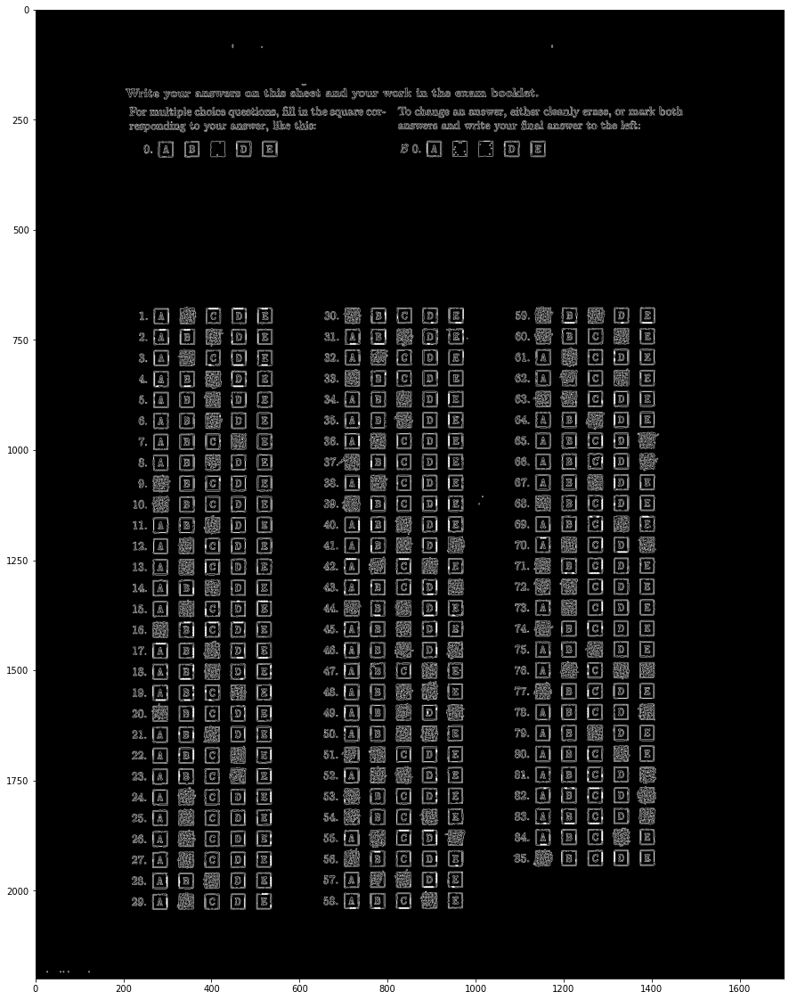

10 10000


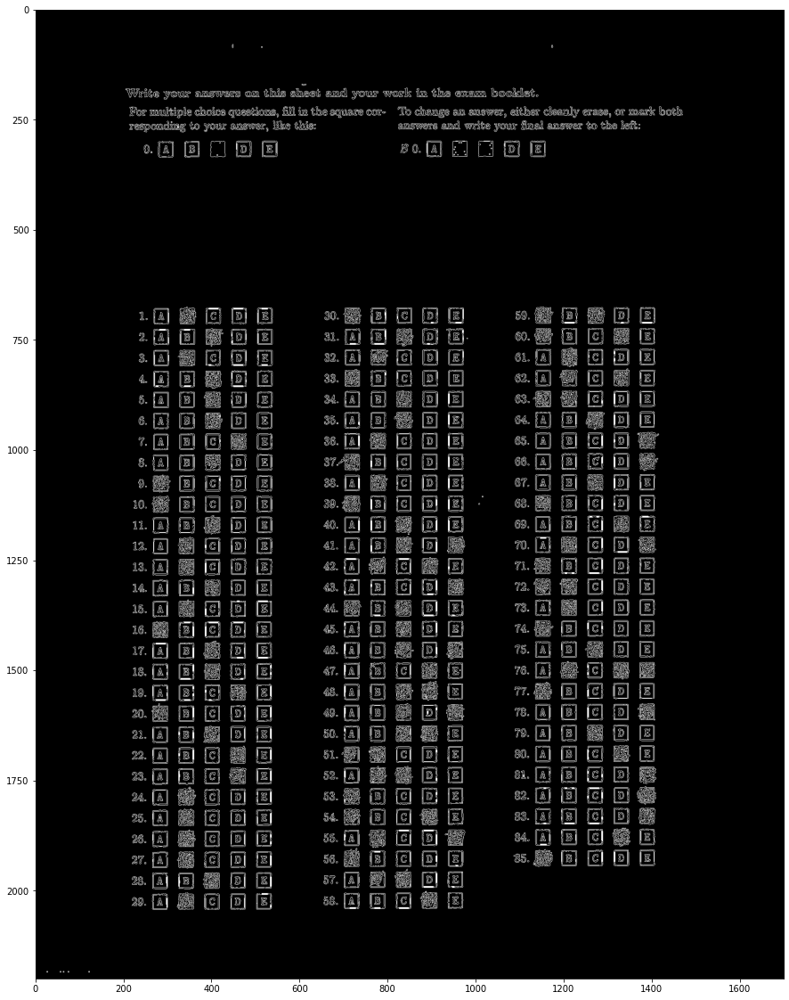

10 20000


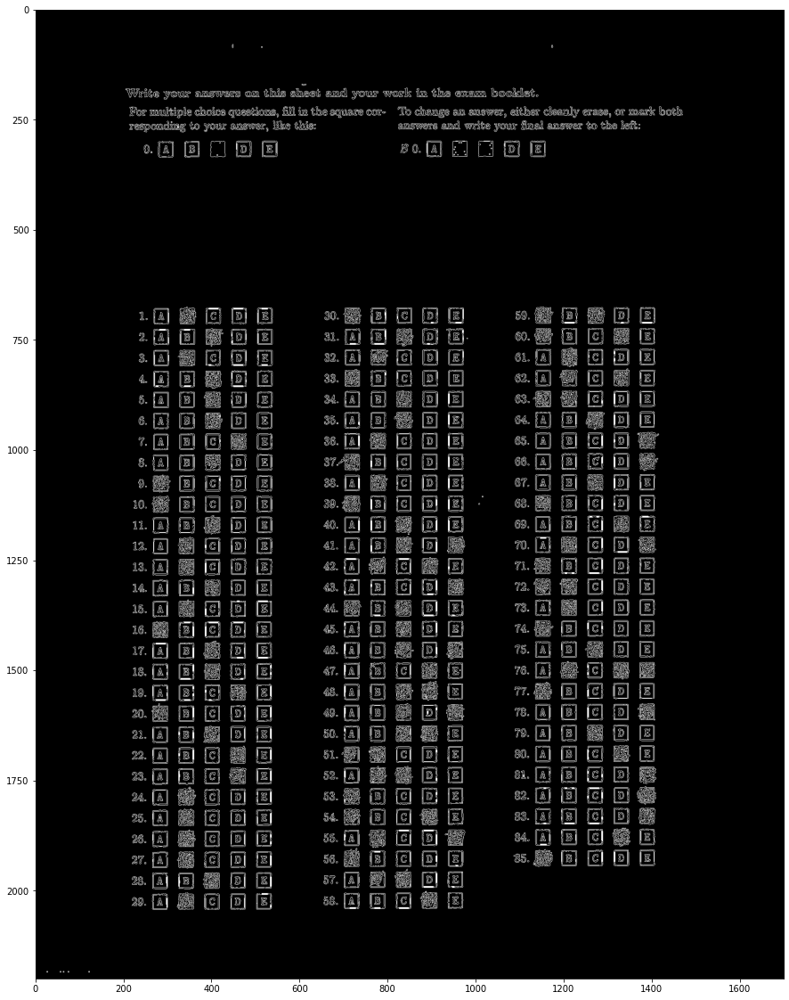

10 30000


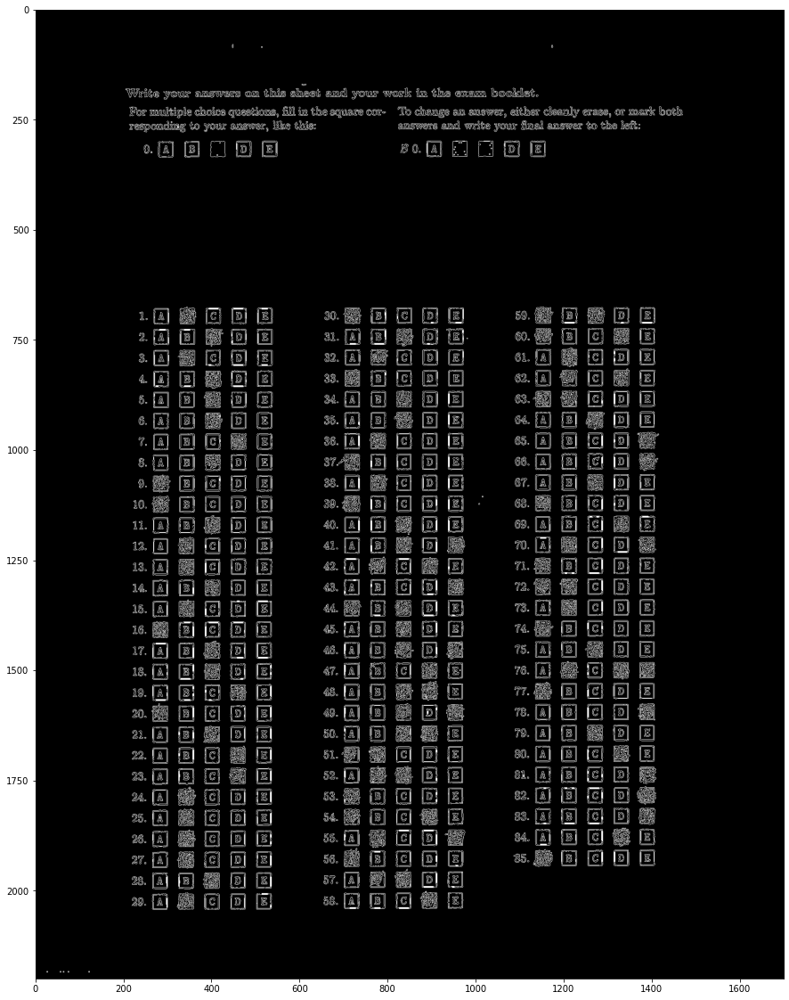

10 40000


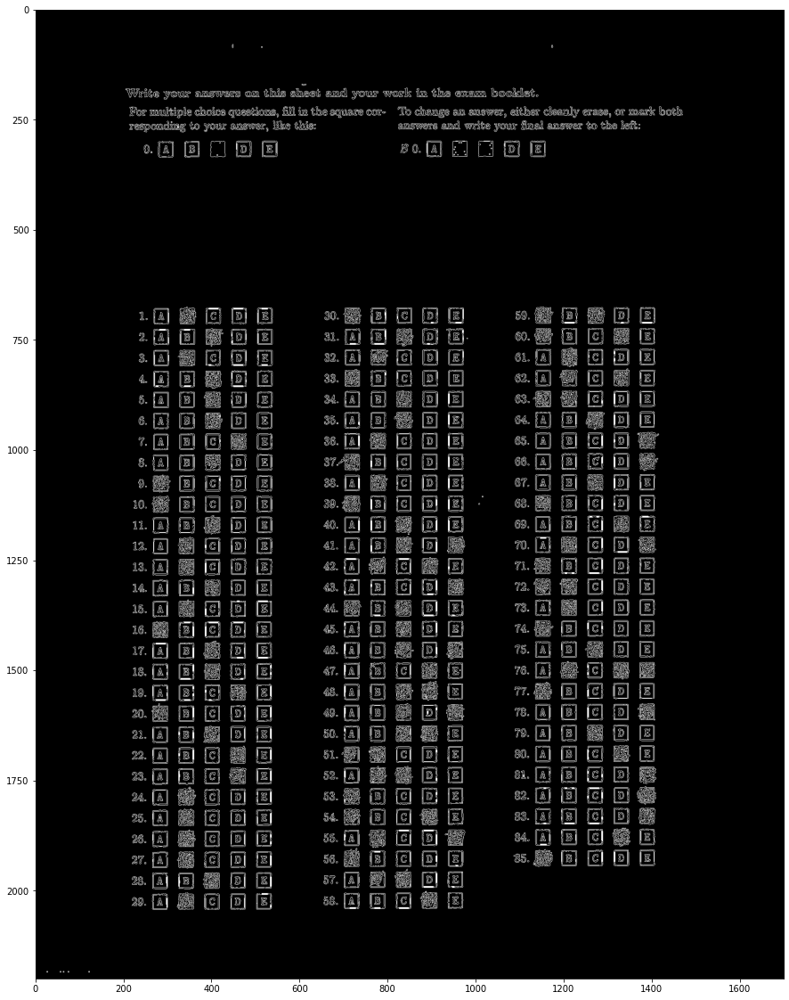

10 50000


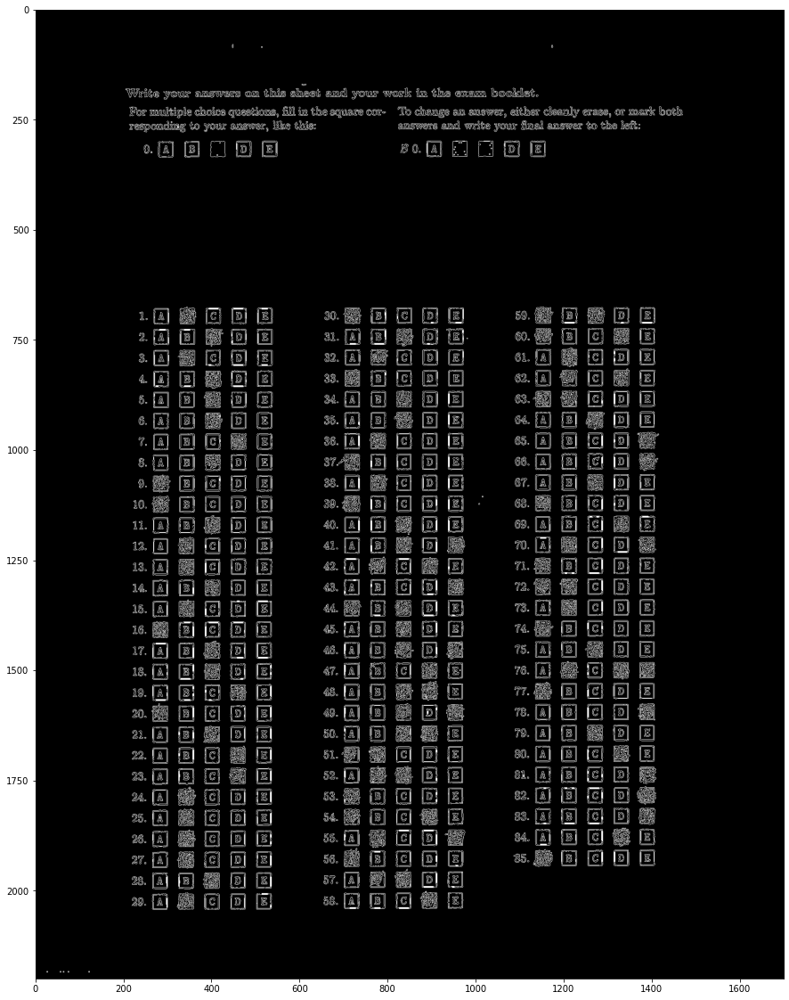

10 60000


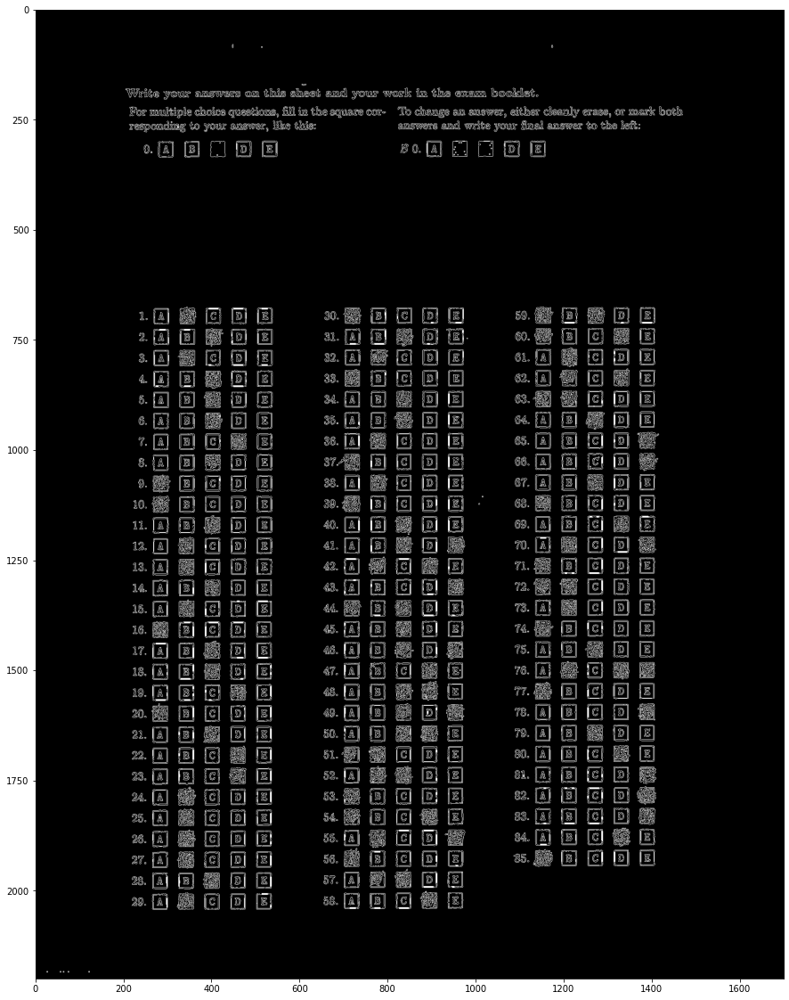

10 70000


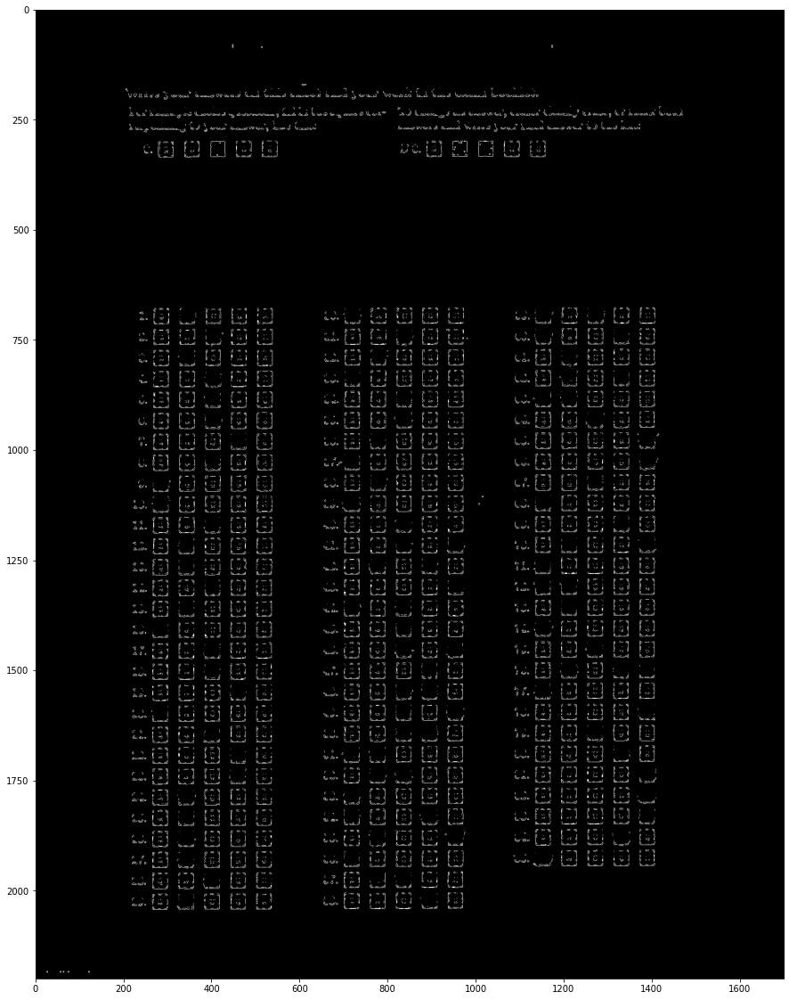

20 10000


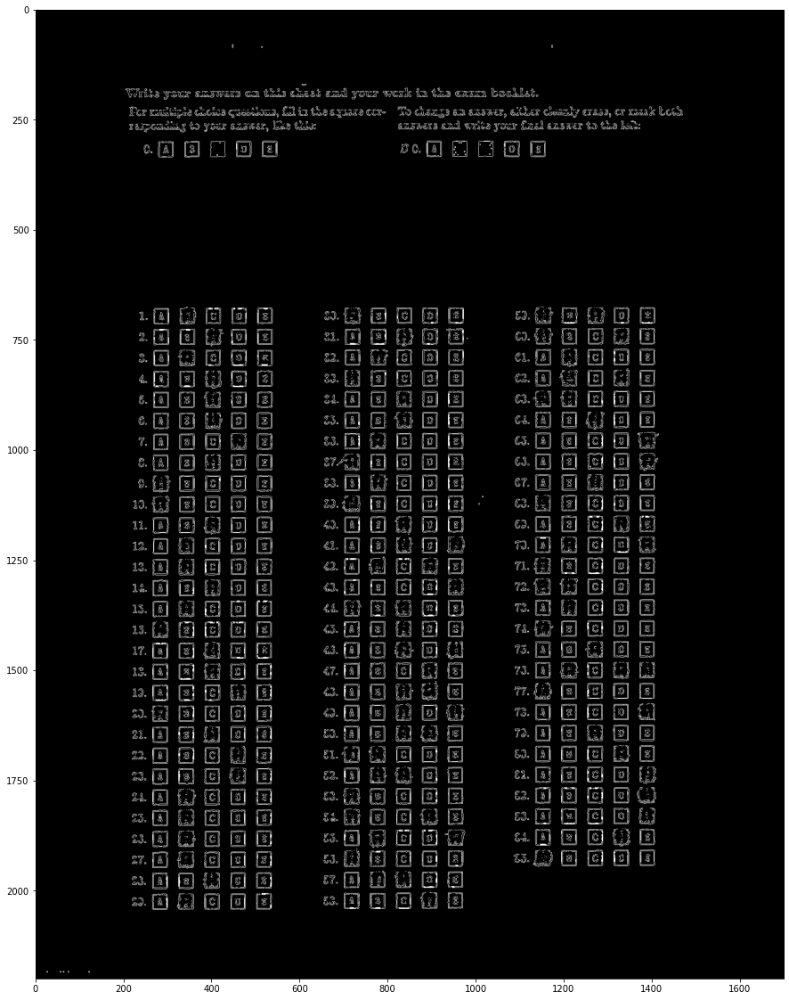

20 20000


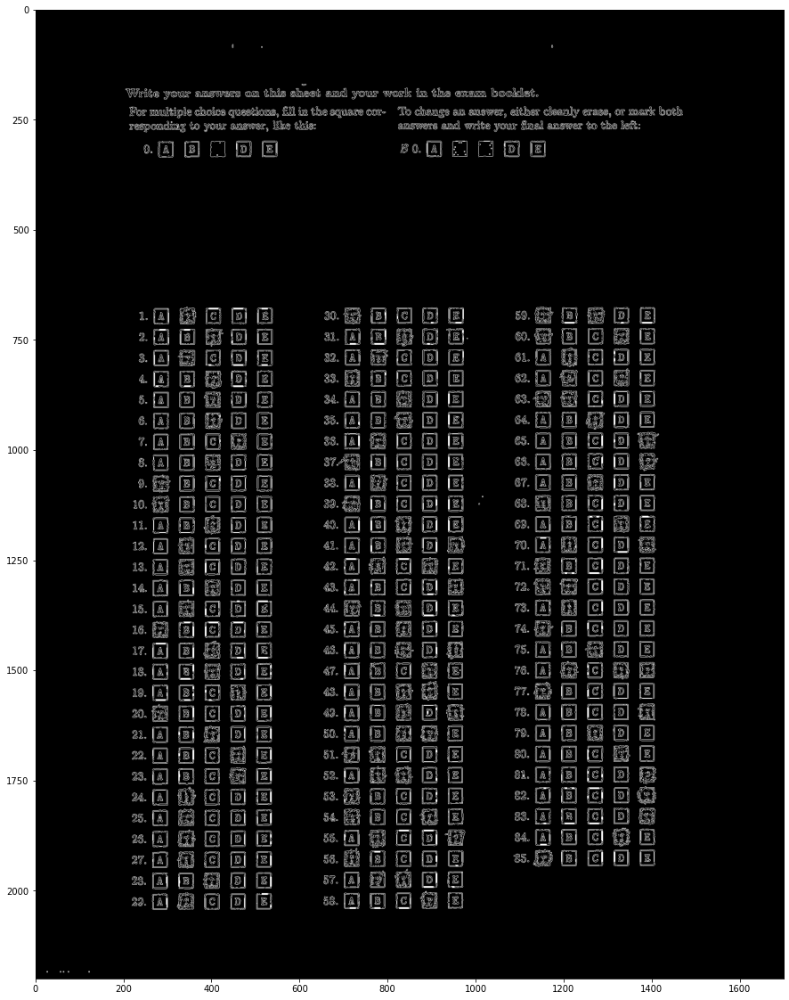

20 30000


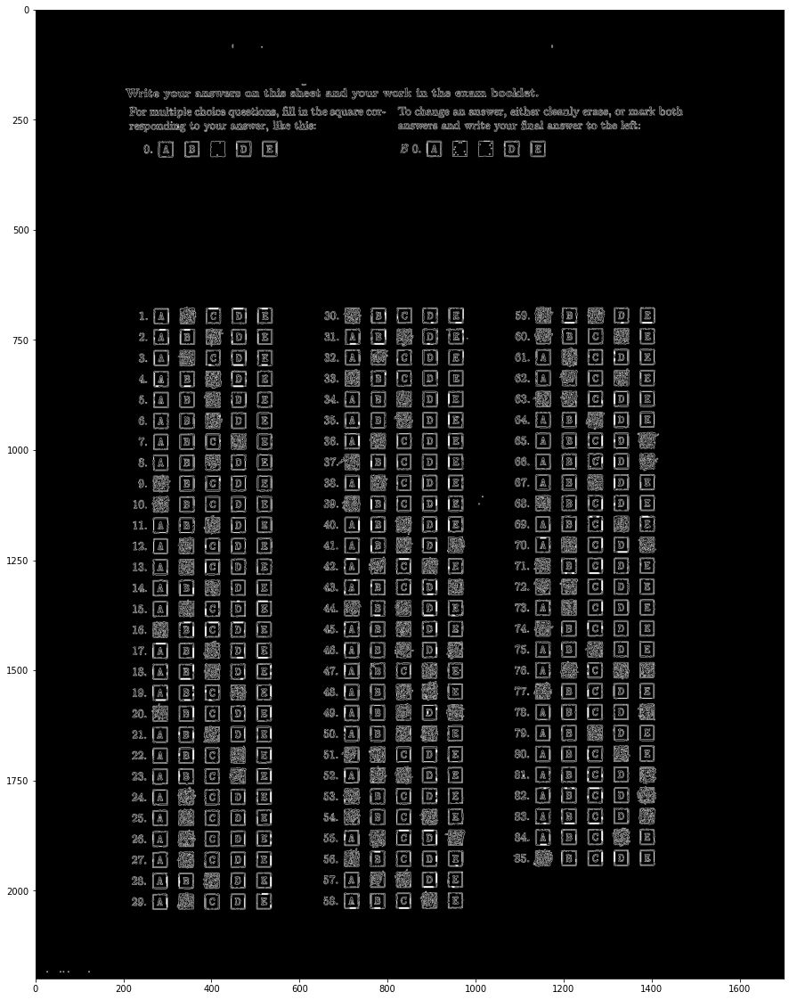

20 40000


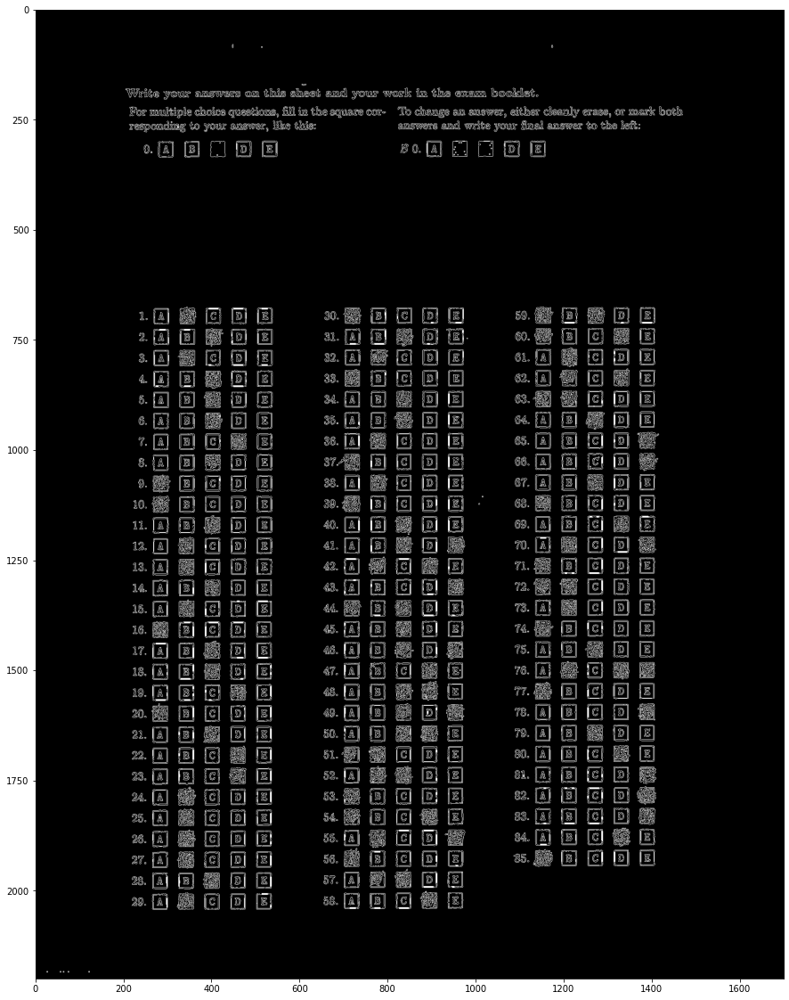

20 50000


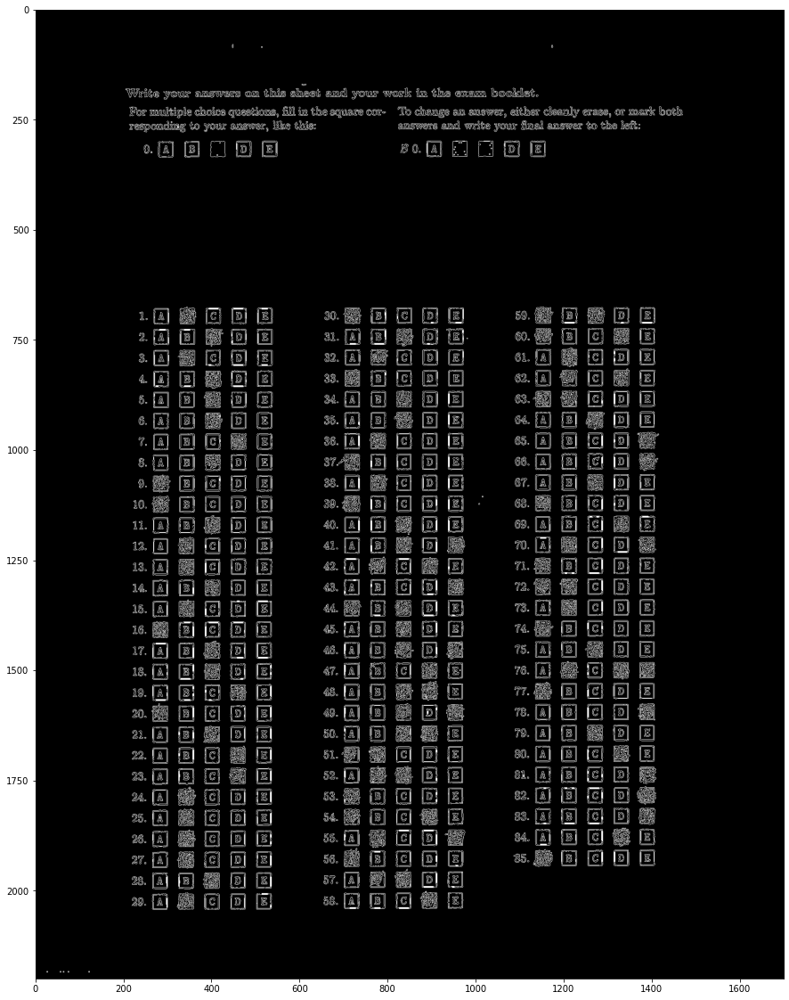

20 60000


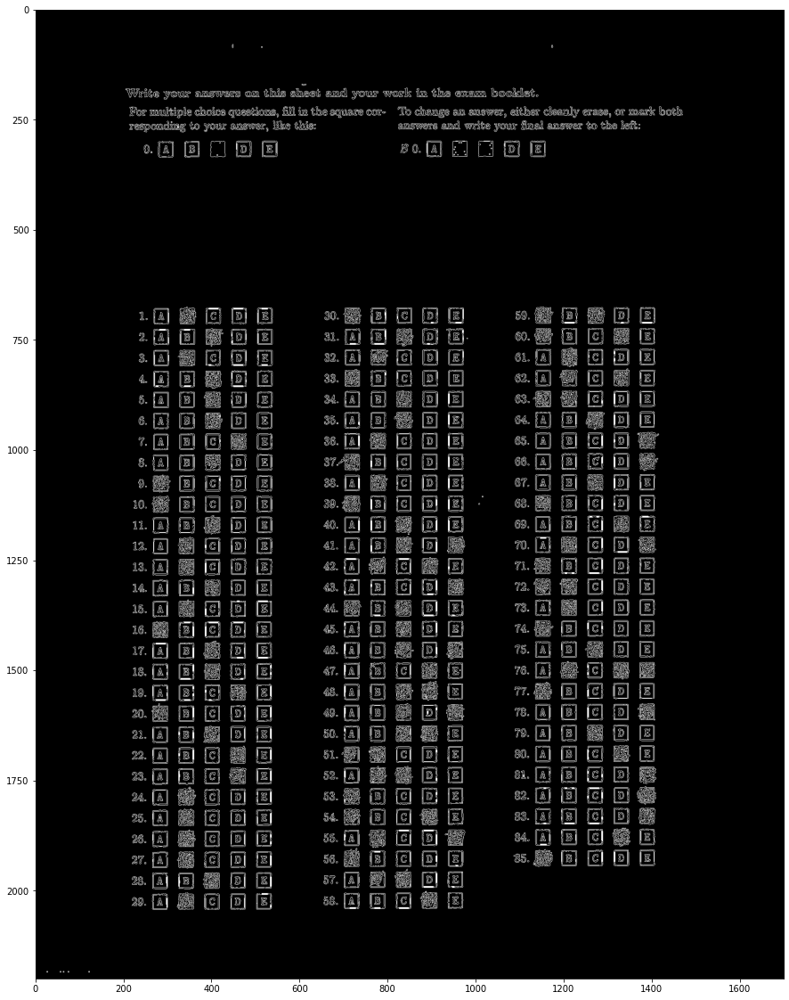

20 70000


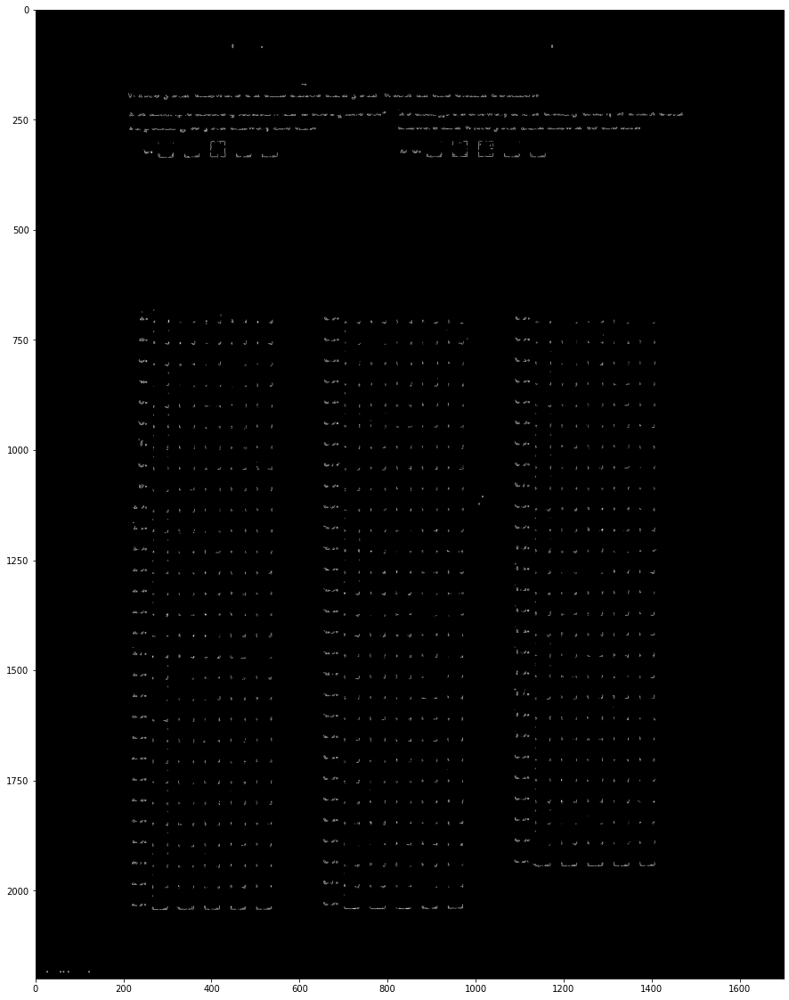

30 10000


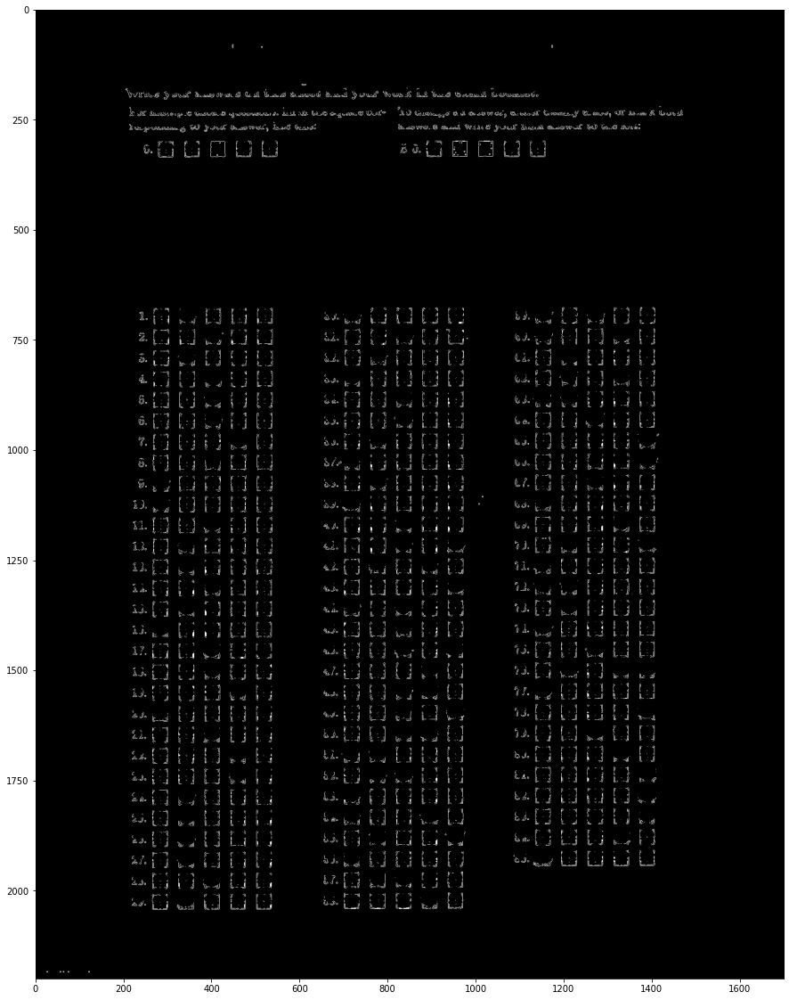

30 20000


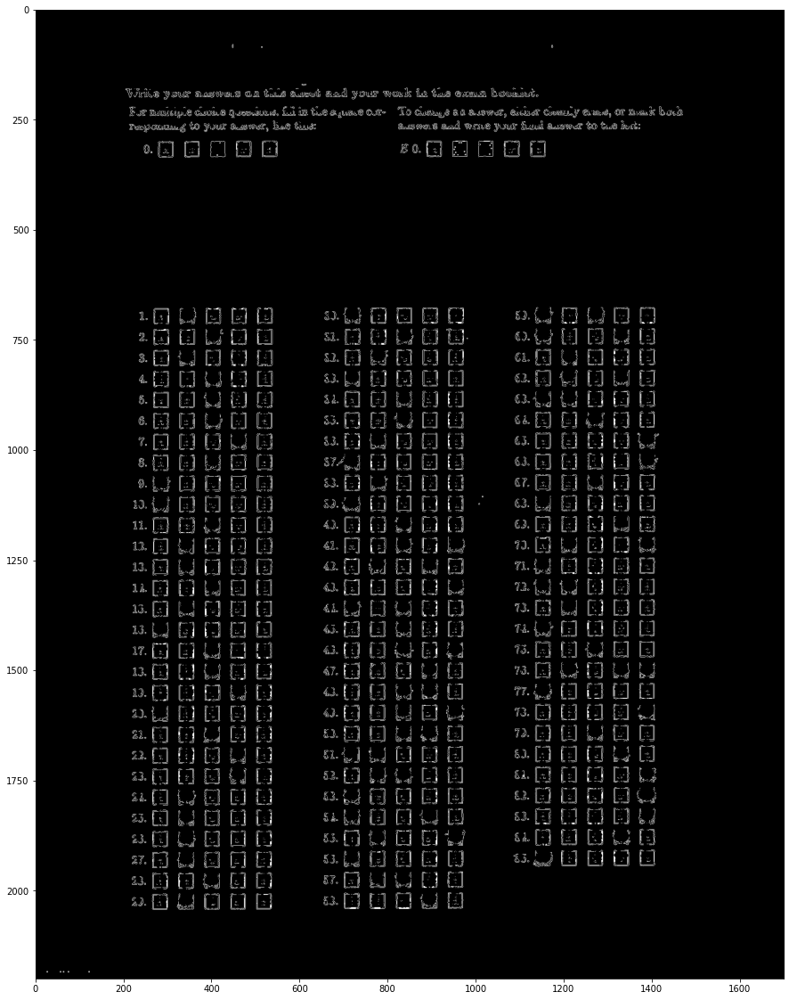

30 30000


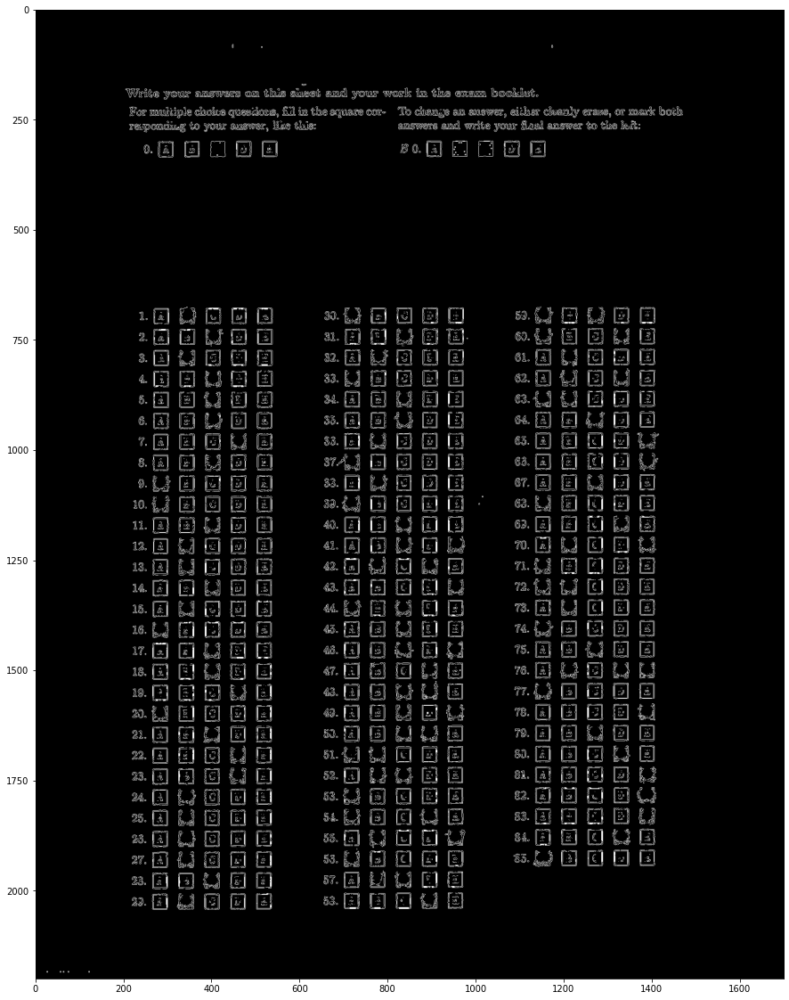

30 40000


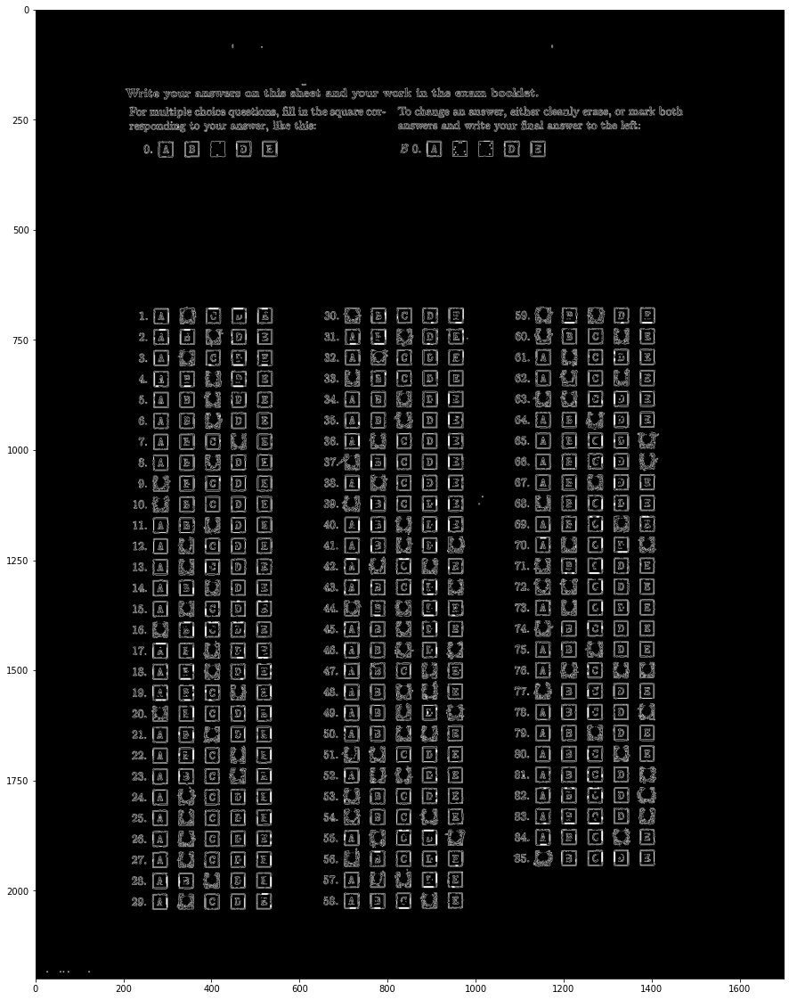

30 50000


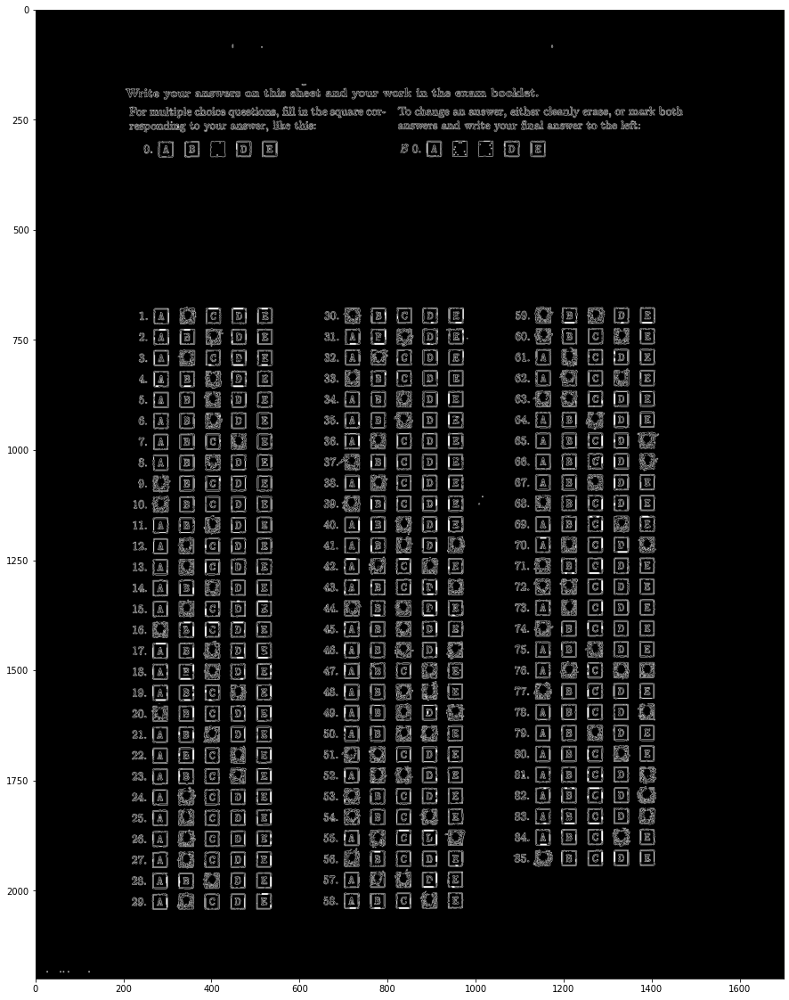

30 60000


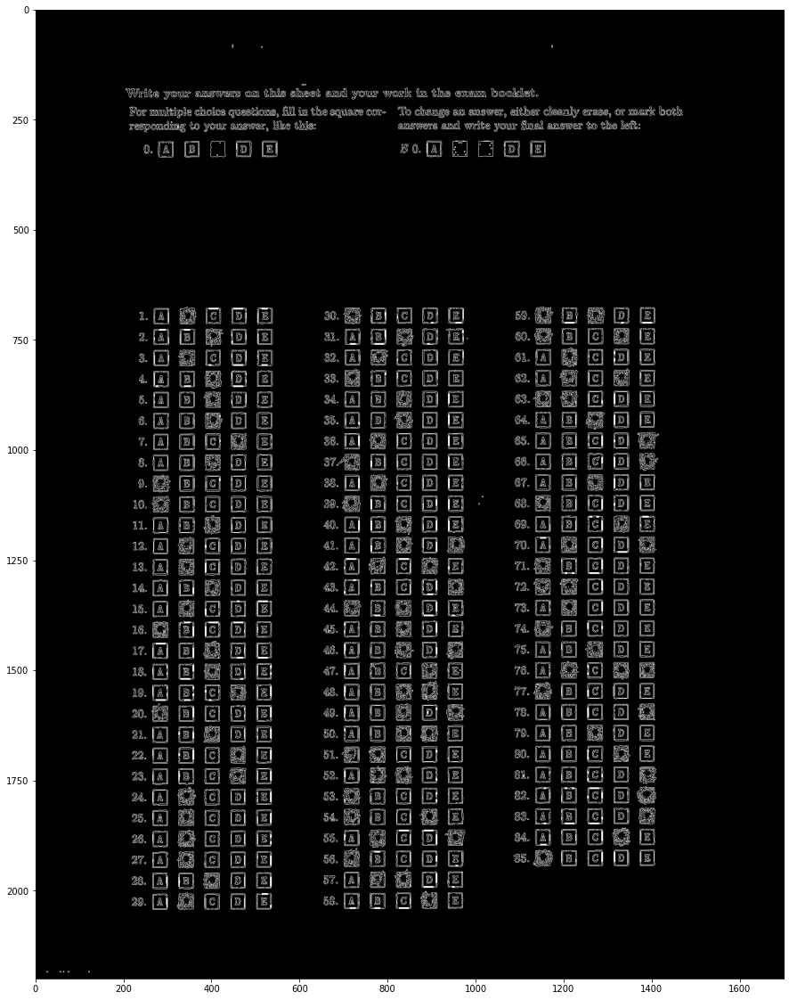

30 70000


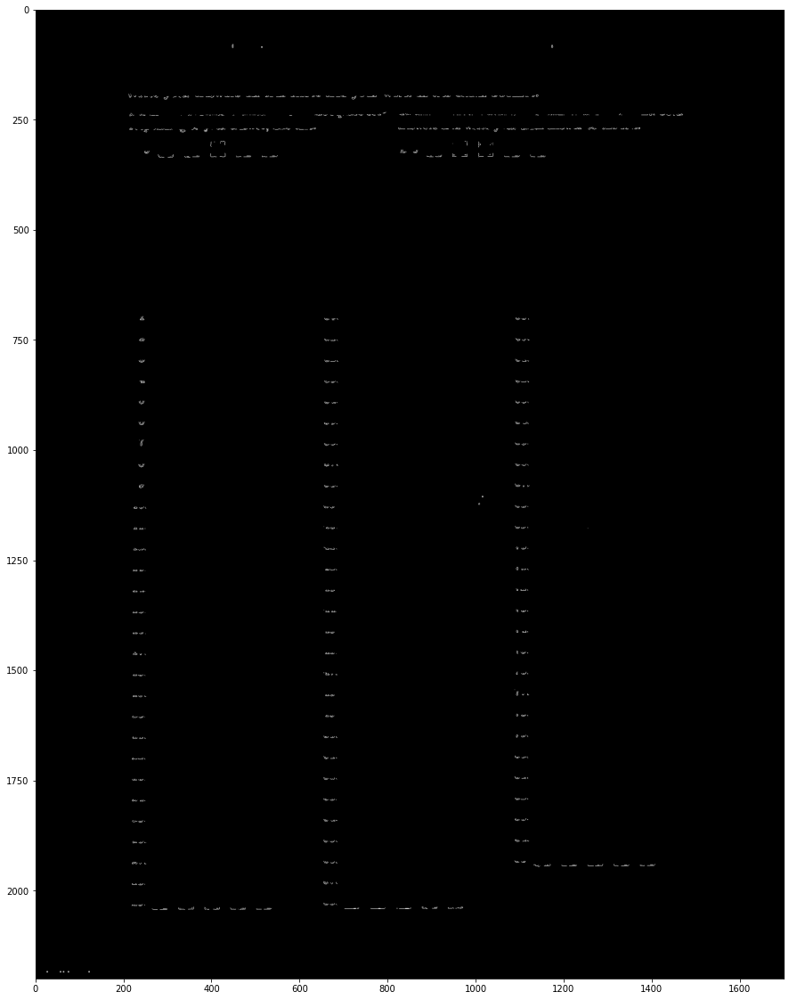

40 10000


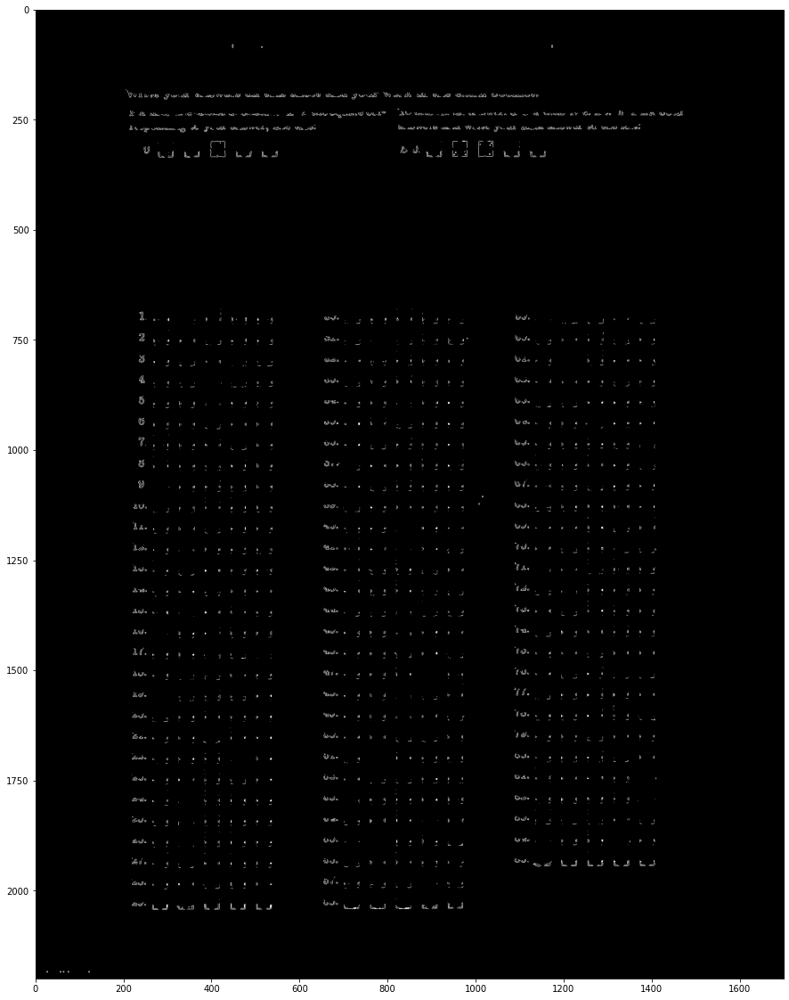

40 20000


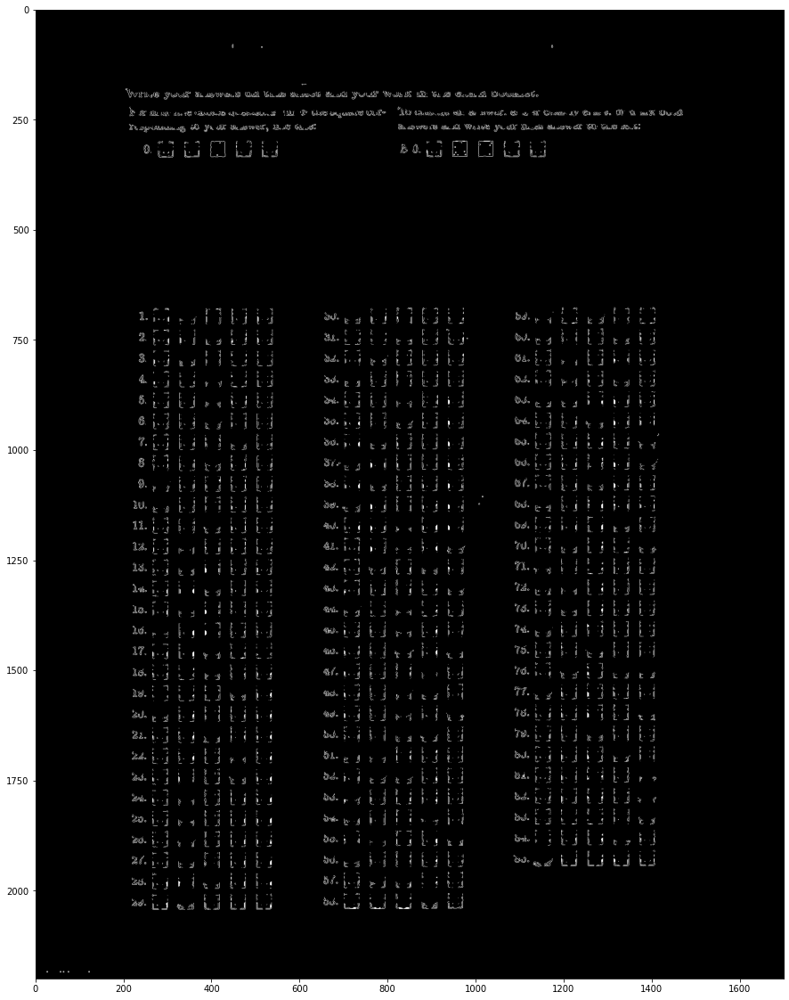

40 30000


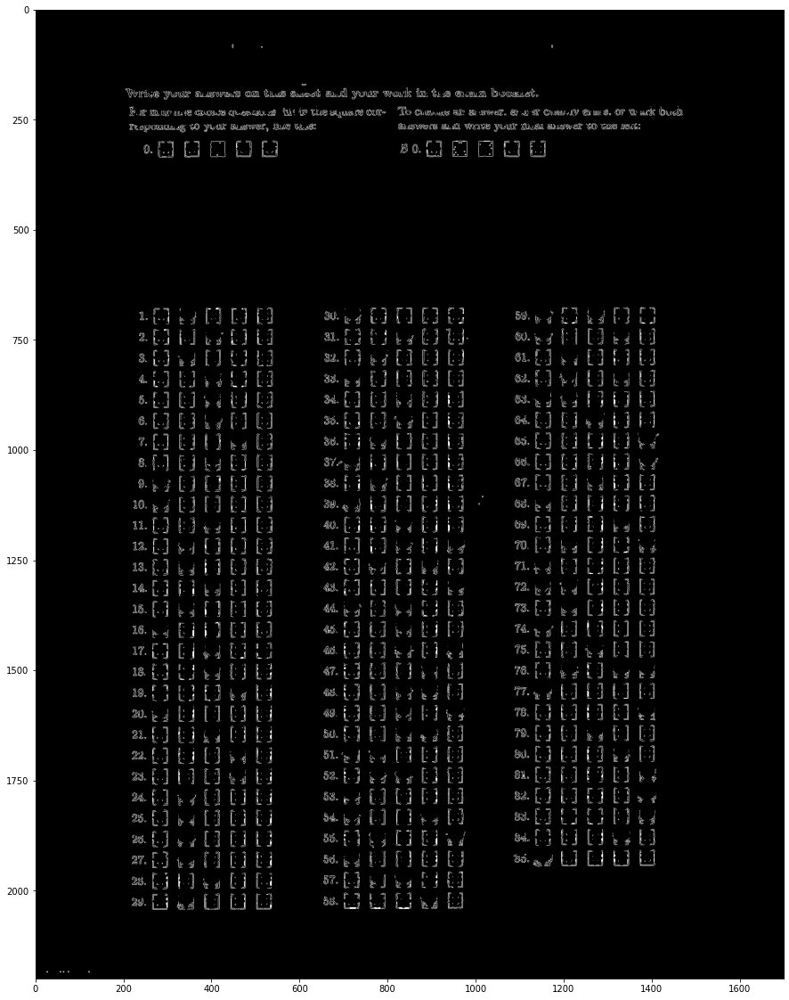

40 40000


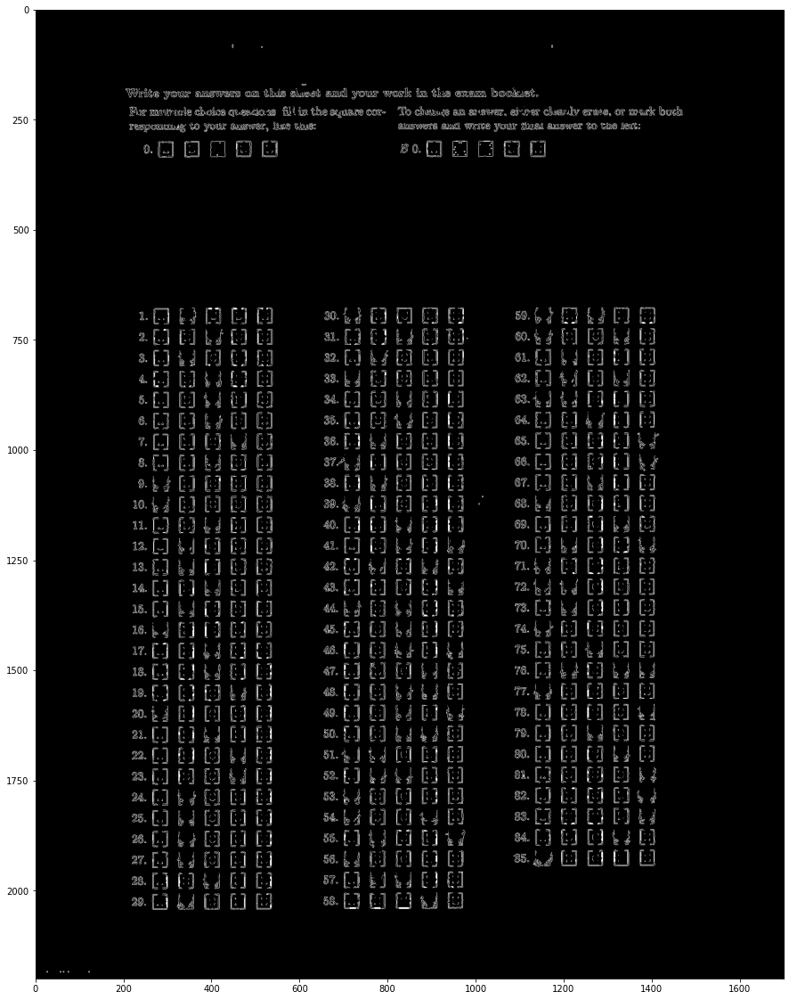

40 50000


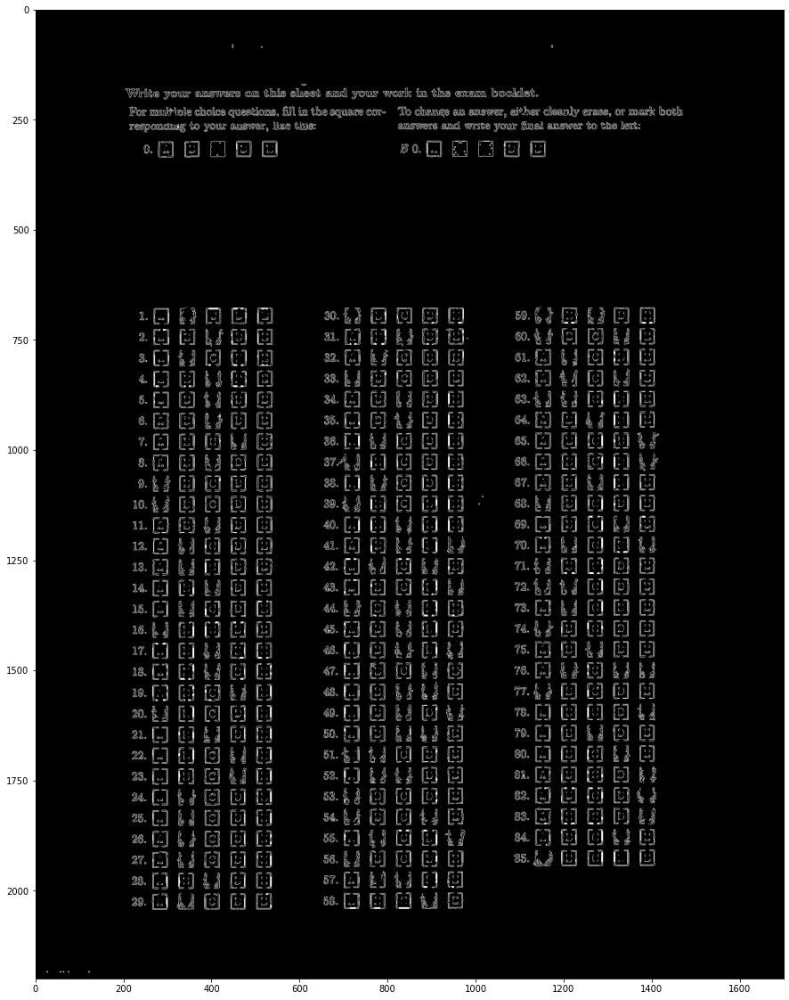

40 60000


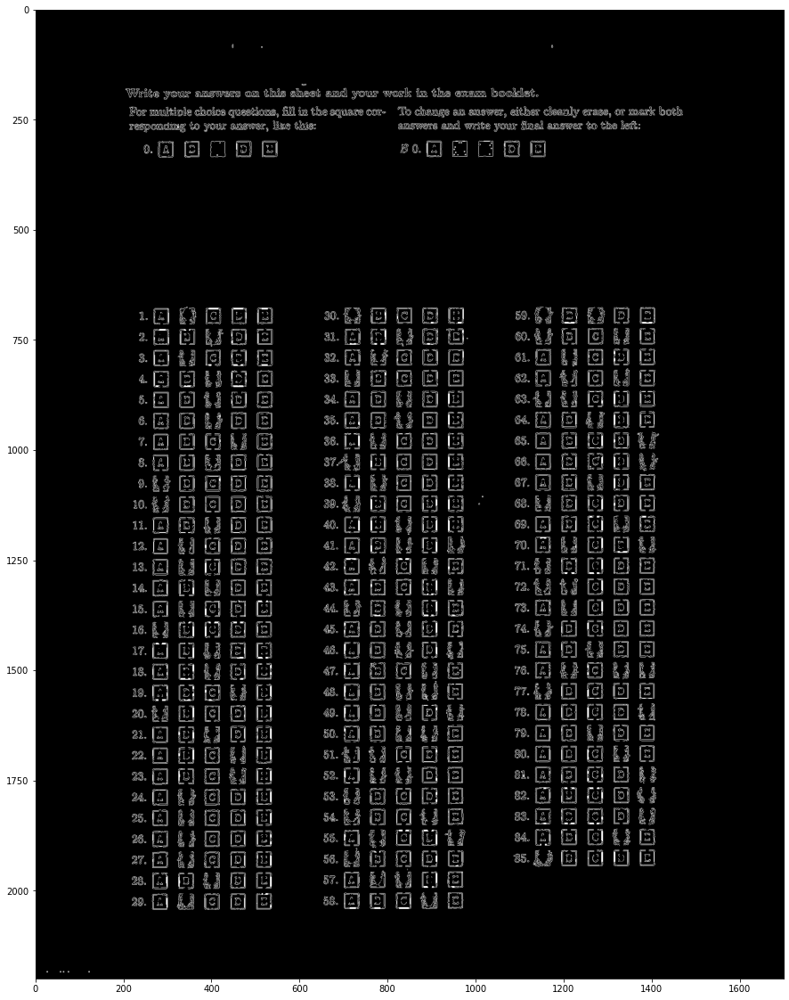

40 70000


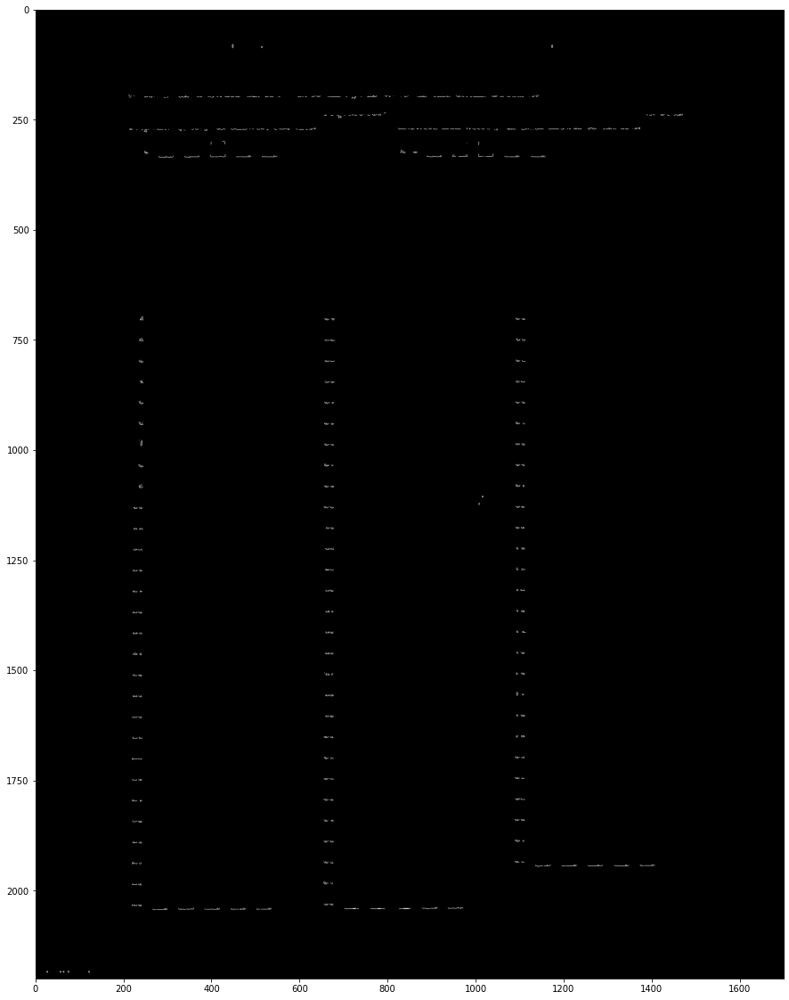

50 10000


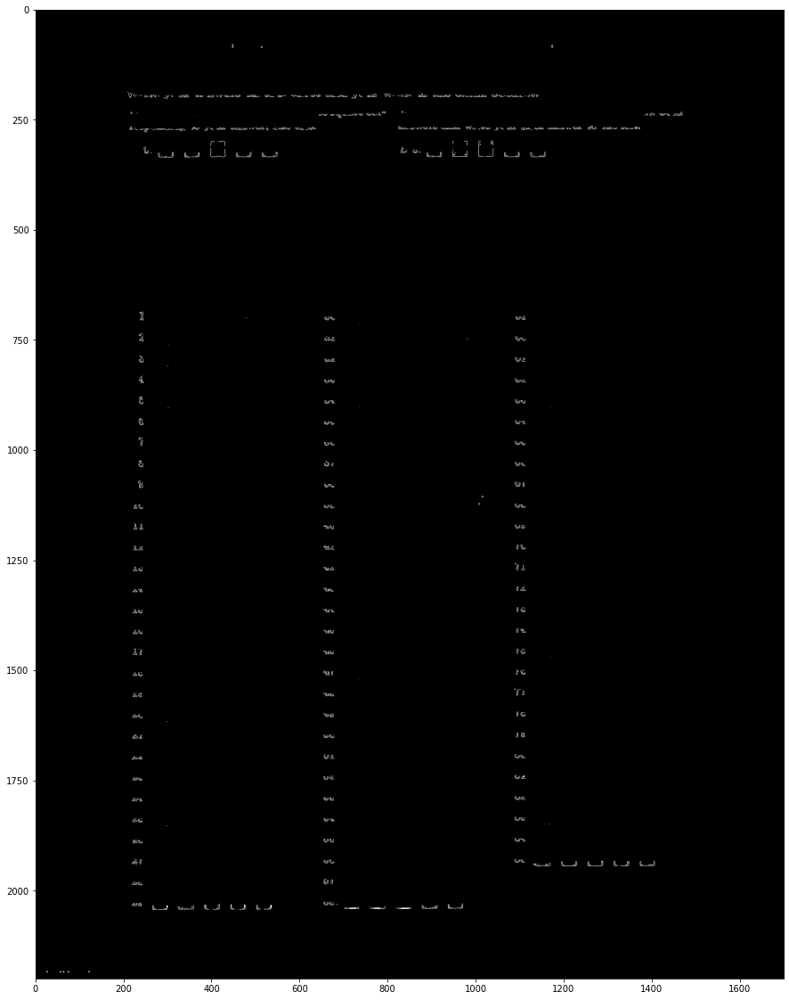

50 20000


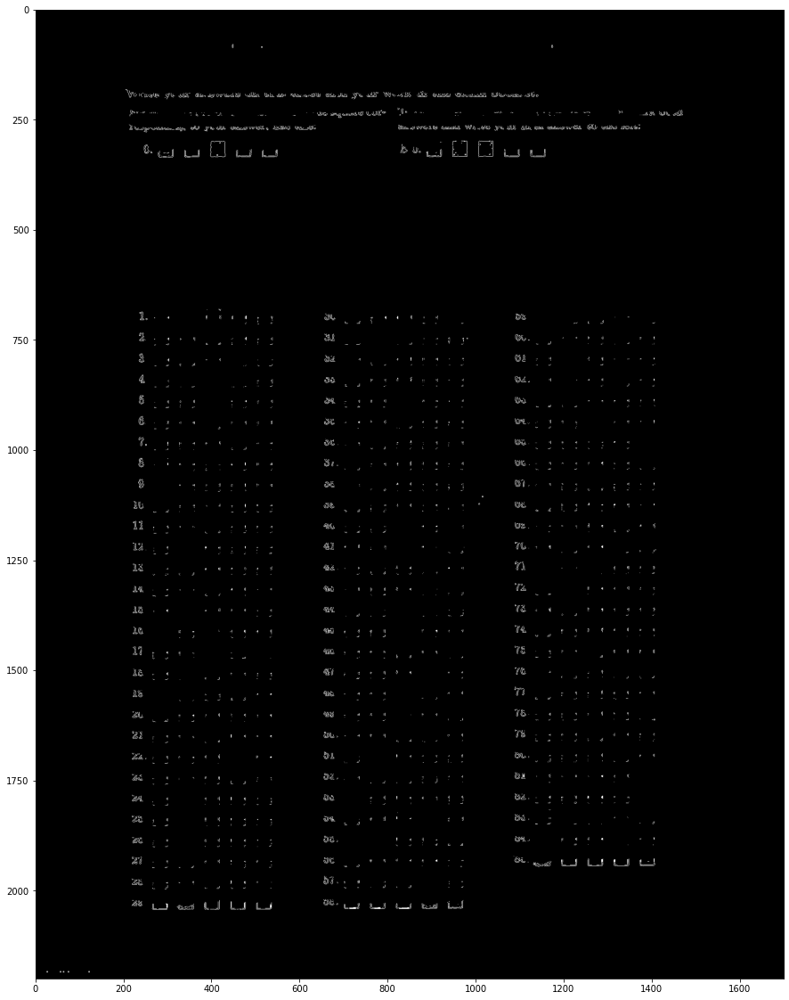

50 30000


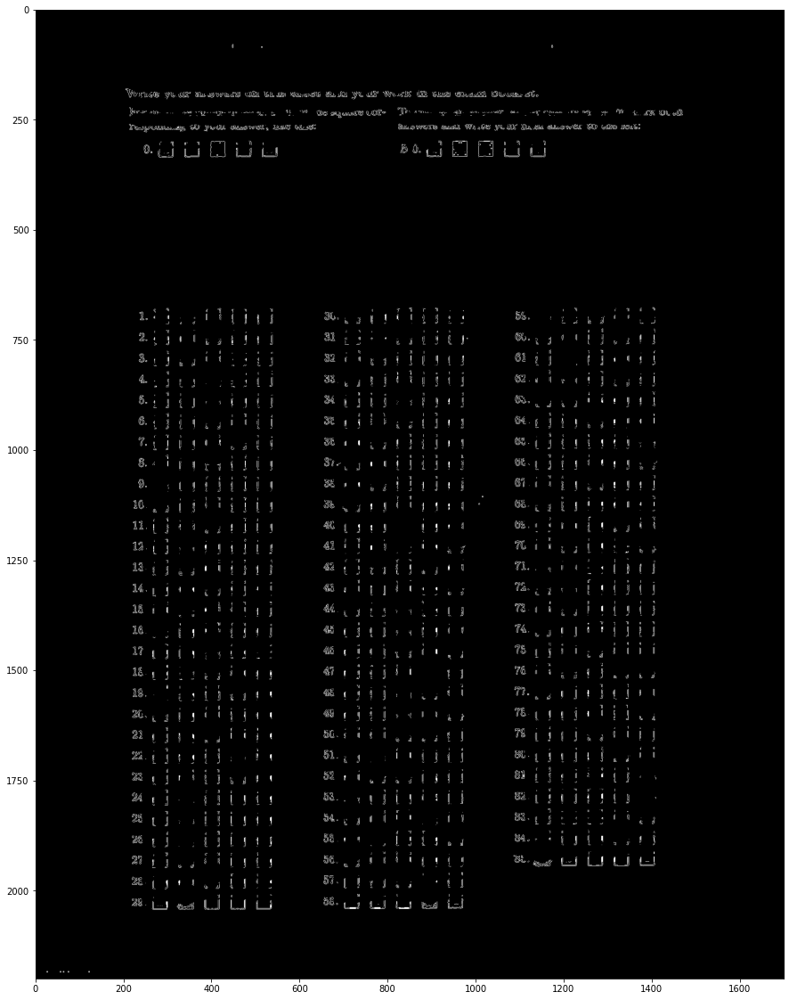

50 40000


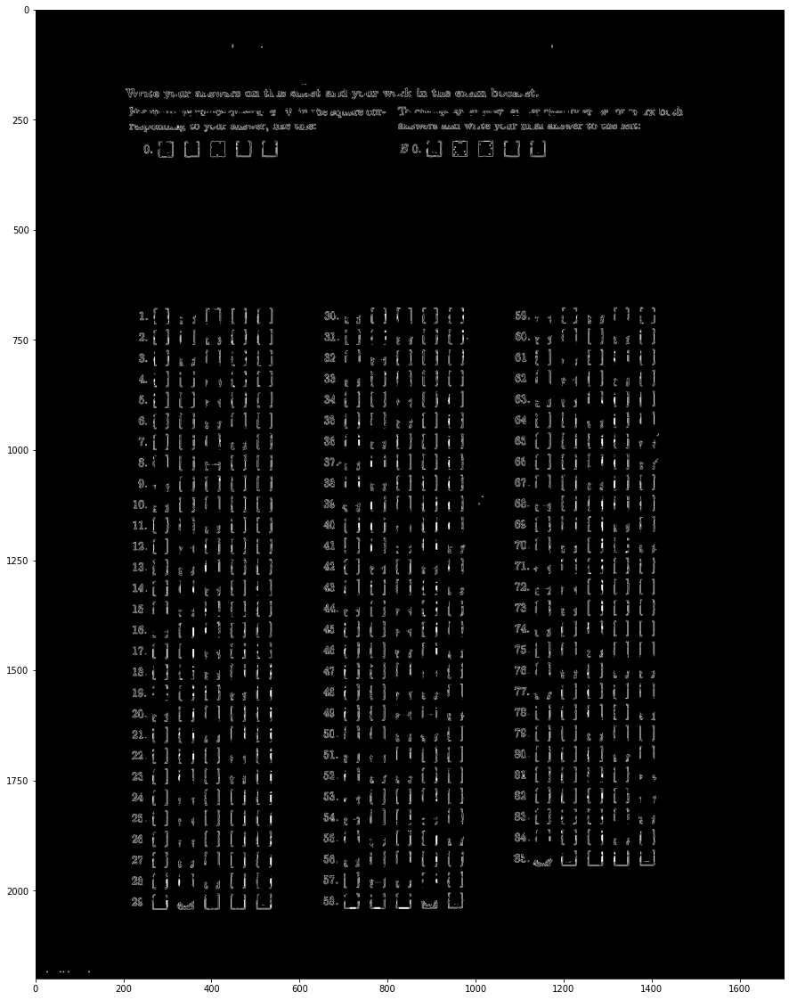

50 50000


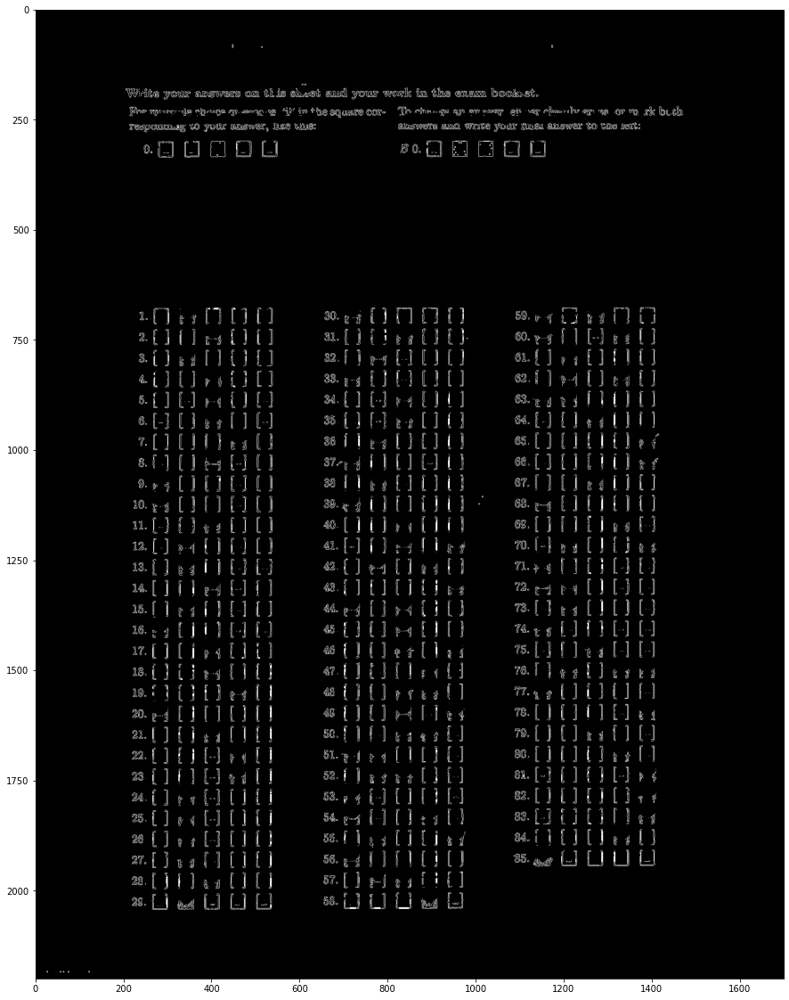

50 60000


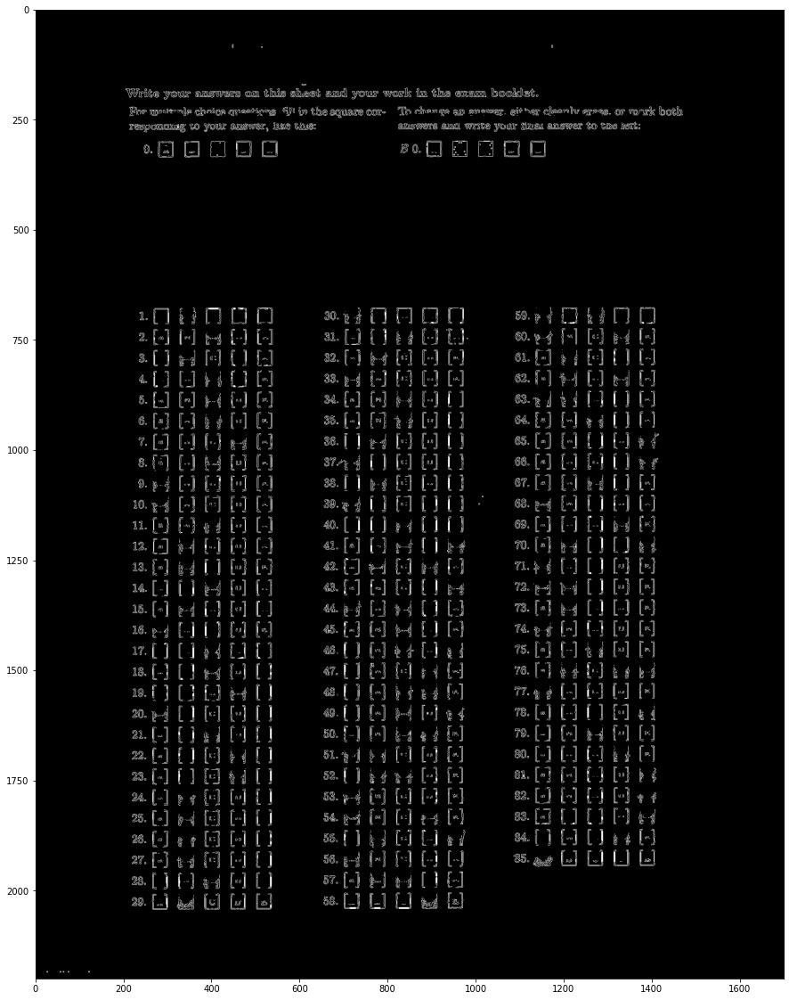

50 70000


In [ ]:
for i in [10, 20, 30, 40, 50]:
    for j in [10000, 20000, 30000, 40000, 50000, 60000, 70000]:
        temp = method(canny.copy(), np.ones((i, i)), j, stride = 1)
        plt.figure(figsize=(25,20))
        plt.imshow(temp, cmap='gray')
        plt.show()
        print(i, j)

# Segmented

In [388]:
image = np.array(imageio.imread('b-27.jpg',as_gray=True))
norm_img = np.abs(image - 255.)
shrpened = Sharpen(norm_img, sharpen_kernel, -0.2)
# shrpened = Sharpen(image, sharpen_kernel, -0.2)
im = Canny_Edge_Detection(shrpened, 50, 10)
# im = Canny_Edge_Detection(norm_img, 50, 10)
im = method(im.copy(), np.ones((20, 20)), 20000, stride = 1)
canny_im = Image.fromarray(im)

def Hough_voter(img, angle, vote_list):
    votes = vote_list
    for i in range(img.width):
        for j in range(img.height):
            if img.getpixel((i,j)) == 255:
                rho = i*np.cos(np.deg2rad(angle)) + j*np.sin(np.deg2rad(angle))
                votes[abs(int(rho))] += 1
    return votes

vertical_votes = Hough_voter(canny_im, 0, [0 for i in range(canny_im.width)])
horizontal_votes = Hough_voter(canny_im, 90, [0 for i in range(canny_im.height)])

# removing first 600 horizontal lines from consideration
for i in range(600):
    horizontal_votes[i] = 0

horizontal_pixels = [(idx, i) for idx, i in enumerate(horizontal_votes)]
vertical_pixels = [(idx, i) for idx, i in enumerate(vertical_votes)]

horizontal_pixels = sorted(horizontal_pixels, key=lambda x:(x[1], x[0]), reverse = True)[:250]
vertical_pixels = sorted(vertical_pixels, key=lambda x:(x[1], x[0]), reverse = True)[:80]

# Sorting back based on the pixels locations and not votes
horizontal_pixels = sorted(horizontal_pixels, key=lambda x:(x[0], x[1]), reverse = False)
vertical_pixels = sorted(vertical_pixels, key=lambda x:(x[0], x[1]), reverse = False)

FileNotFoundError: No such file: '/Users/the_dark_lord/Downloads/B657_CV/Assignments/Assignment_1/test_code/b-27.jpg'

In [368]:
# edit in this part is only to avoid sending it into an infinite loop

new_vertical_pixels = []
pixel_diff = 25
verti_iter = 0
min_len = 30
best_verti_iter = None
while True:
    verti_iter+=1
    prev = 0
    for i in vertical_pixels:
        i = i[0]
        if prev != 0:
            if i - prev < pixel_diff:
                continue
        prev = i
        new_vertical_pixels.append(i)
            
    length = len(new_vertical_pixels)
    if abs(length - 30) < min_len:
        min_len = abs(length - 30)
        best_verti_iter = new_vertical_pixels.copy()
        
    if length == 30:
        break
    elif length < 30 : 
        pixel_diff -= 1
    else:
        pixel_diff += 1
    
    if veri_iter > 20:
        break
    # print(pixel_diff, length)
    new_vertical_pixels.clear()
    
new_horizontal_pixels = []
pixel_diff = 12
hori_iter = 0
min_len = 58
best_hori_iter = None
while True:
    hori_iter += 1
    prev = 0
    for i in horizontal_pixels:
        i = i[0]
        if prev != 0:
            if i - prev < pixel_diff:
                continue
        prev = i
        new_horizontal_pixels.append(i)
            
    length = len(new_horizontal_pixels)
    if abs(length - 58) < min_len:
        # print("min_len", min_len)
        min_len = abs(length - 58)
        # print("min_len after", min_len)
        best_hori_iter = new_horizontal_pixels.copy()
        # print("best_hori", min_len, len(best_hori_iter))
        
    if length == 58:
        break
    elif length < 58 : 
        pixel_diff -= 1
    else:
        pixel_diff += 1
    
    if hori_iter > 20:
        break
    # print(pixel_diff, length)
    new_horizontal_pixels.clear()
    
# t = best_hori_iter.copy()
    
# horizontal_pixels2 = horizontal_pixels.copy()
# horizontal_pixels2 = sorted(horizontal_pixels2, key=lambda x:(x[0], x[1]), reverse = True)
# new_arr = [horizontal_pixels2.pop(0)[0]]
# try:
#     while True:
#         temp = []
#         first = new_arr[-1]
#         # if first == 1945:
#         #     while True and len(horizontal_pixels2) > 0:
#         #         diff = abs(horizontal_pixels2[0][0] - first)
#         #         print("diff", diff, horizontal_pixels2[0][0])
#         #         if diff < 40 and diff > 25:
#         #             temp.append(horizontal_pixels2.pop(0)[0])
#         #         else:
#         #             break
#         while True and len(horizontal_pixels2) > 0:
#             diff = abs(horizontal_pixels2[0][0] - first)
#             if diff < 40:
#                 temp.append((diff, horizontal_pixels2.pop(0)[0]))
#             else:
#                 break
#         if len(horizontal_pixels2) == 0 and len(temp) == 0:
#             break
#         temp = sorted(temp, key = lambda x: (x[0], x[1]), reverse=True)
#         new_arr.append(temp[0][1])
#         if len(horizontal_pixels2) == 0:
#             break

#         temp2 = []
#         second = new_arr[-1]
#         while True and len(horizontal_pixels2) > 0:
#             diff = abs(horizontal_pixels2[0][0] - second)
#             if diff < 15:
#                 temp2.append((diff, horizontal_pixels2.pop(0)[0]))
#             else:
#                 break
#         if len(horizontal_pixels2) == 0 and len(temp2) == 0:
#             break
#         temp = sorted(temp, key = lambda x: (x[0], x[1]), reverse=True)
#         new_arr.append(temp2[0][1])
#         # if len(horizontal_pixels2) == 0:
#         #     break
# except:
#     if len(new_arr) == 58:
#         best_hori_iter.clear()
#         best_hori_iter = new_arr.copy()
# horizontal_pixels2 = horizontal_pixels.copy()
# horizontal_pixels2 = sorted(horizontal_pixels2, key=lambda x:(x[0], x[1]), reverse = True)
# new_arr = [horizontal_pixels2.pop(0)[0]]
# while True:
#     temp = []
#     first = new_arr[-1]
#     while True and len(horizontal_pixels2) > 0:
#         diff = abs(horizontal_pixels2[0][0] - first)
#         if diff < 40:
#             temp.append(horizontal_pixels2.pop(0)[0])
#         else:
#             break
#     new_arr.append(max(temp))
#     if len(horizontal_pixels2) == 0:
#         break
        
#     temp2 = []
#     second = new_arr[-1]
#     while True and len(horizontal_pixels2) > 0:
#         diff = abs(horizontal_pixels2[0][0] - second)
#         if diff < 20:
#             temp2.append(horizontal_pixels2.pop(0)[0])
#         else:
#             break
#     new_arr.append(min(temp2))
#     if len(horizontal_pixels2) == 0:
#         break
    
# if len(new_arr) == 58:
#     best_hori_iter = new_arr.copy()

In [373]:
horizontal_pixels2 = horizontal_pixels.copy()
horizontal_pixels2 = sorted(horizontal_pixels2, key=lambda x:(x[0], x[1]), reverse = True)
new_arr = [horizontal_pixels2.pop(0)[0]]
try:
    while True:
        temp = []
        first = new_arr[-1]
        while True and len(horizontal_pixels2) > 0:
            diff = abs(horizontal_pixels2[0][0] - first)
            if diff < 40:
                temp.append(horizontal_pixels2.pop(0)[0])
            else:
                break
        if len(horizontal_pixels2) == 0 and len(temp) == 0:
            break
        new_arr.append(min(temp))
        if len(horizontal_pixels2) == 0:
            break

        temp2 = []
        second = new_arr[-1]
        while True and len(horizontal_pixels2) > 0:
            diff = abs(horizontal_pixels2[0][0] - second)
            if diff < 16:
                temp2.append(horizontal_pixels2.pop(0)[0])
            else:
                break
        if len(horizontal_pixels2) == 0 and len(temp2) == 0:
            break
        new_arr.append(max(temp2))
        # if len(horizontal_pixels2) == 0:
        #     break
except:
    pass
if len(new_arr) == 58:
    best_hori_iter = new_arr

In [375]:
len(best_hori_iter), len(best_verti_iter), len(new_arr)

(58, 30, 58)

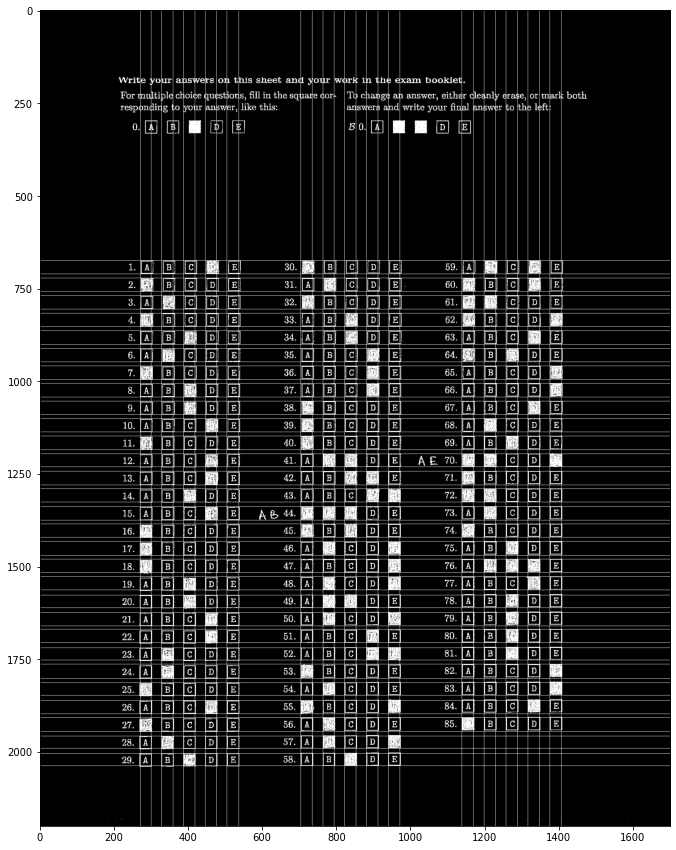

In [377]:
norm_img2= norm_img.copy()
for i in best_hori_iter:
    norm_img2[i,:] = 255
    
for i in best_verti_iter:
    norm_img2[:,i] = 255
    
plt.figure(figsize=(15, 15))
plt.imshow(norm_img2, cmap='gray')

In [378]:
def find_threshold(norm_img, hori_arr, vl):
    min_sum = 0
    max_sum = 0
    for x in range(0, 58, 2):
        x1 = hori_arr[x]
        x2 = hori_arr[x+1]
        block_a = norm_img[x1:x2, vl[0]:vl[1]]
        block_b = norm_img[x1:x2, vl[2]:vl[3]]
        block_c = norm_img[x1:x2, vl[4]:vl[5]]
        block_d = norm_img[x1:x2, vl[6]:vl[7]]
        block_e = norm_img[x1:x2, vl[8]:vl[9]]
        arr = [np.sum(block_a), np.sum(block_b), np.sum(block_c),np.sum(block_d), np.sum(block_e)]
        min_sum+=min(arr)
        max_sum+=max(arr)
    return np.mean([min_sum/29, max_sum/29])

find_threshold(best_hori_iter.copy(), best_verti_iter.copy())

133187.91379310345

In [385]:
def check_marks(img, y1, y2, x1, x2):
    block = img[y1:y2, x1-120:x1-60]
    if np.sum(block)>1000:
        return True 
    else:
        return False

In [386]:
# best_hori_iter = best_hori_iter[::-1]
# For questions 1-29
ques_ans = {}
vl = best_verti_iter[:10]
i = 1
threshold = find_threshold(best_hori_iter.copy(), best_verti_iter.copy())
for x in range(0, 58, 2):
    ans = ''
    x1 = best_hori_iter[x]
    x2 = best_hori_iter[x+1]
    block_a = norm_img[x1:x2, vl[0]:vl[1]]
    block_b = norm_img[x1:x2, vl[2]:vl[3]]
    block_c = norm_img[x1:x2, vl[4]:vl[5]]
    block_d = norm_img[x1:x2, vl[6]:vl[7]]
    block_e = norm_img[x1:x2, vl[8]:vl[9]]
    # print("A", np.sum(block_a))
    # print("B", np.sum(block_b))
    # print("C", np.sum(block_c))
    # print("D", np.sum(block_d))
    # print("E", np.sum(block_e))
    if np.sum(block_a) > threshold:
        ans = ans + "A"
    if np.sum(block_b) > threshold:
        ans = ans + "B"
    if np.sum(block_c) > threshold:
        ans = ans + "C"
    if np.sum(block_d) > threshold:
        ans = ans + "D"
    if np.sum(block_e) > threshold:
        ans = ans + "E"
    if check_marks(norm_img, x1, x2, vl[0], vl[1]):
        ans+=" x"
    ques_ans[i] = ans
    i+=1
    # break
    
# For questions 30-58
vl = best_verti_iter[10:20]
for x in range(0, 58, 2):
    ans = ''
    x1 = best_hori_iter[x]
    x2 = best_hori_iter[x+1]
    block_a = norm_img[x1:x2, vl[0]:vl[1]]
    block_b = norm_img[x1:x2, vl[2]:vl[3]]
    block_c = norm_img[x1:x2, vl[4]:vl[5]]
    block_d = norm_img[x1:x2, vl[6]:vl[7]]
    block_e = norm_img[x1:x2, vl[8]:vl[9]]
    # print("A", np.sum(block_a))
    # print("B", np.sum(block_b))
    # print("C", np.sum(block_c))
    # print("D", np.sum(block_d))
    # print("E", np.sum(block_e))
    if np.sum(block_a) > threshold:
        ans = ans + "A"
    if np.sum(block_b) > threshold:
        ans = ans + "B"
    if np.sum(block_c) > threshold:
        ans = ans + "C"
    if np.sum(block_d) > threshold:
        ans = ans + "D"
    if np.sum(block_e) > threshold:
        ans = ans + "E"
    if check_marks(norm_img, x1, x2, vl[0], vl[1]):
        ans+=" x"
    ques_ans[i] = ans
    i+=1
    
# For questions 59-85
vl = best_verti_iter[20:]
for x in range(0, 54, 2):
    ans = ''
    x1 = best_hori_iter[x]
    x2 = best_hori_iter[x+1]
    block_a = norm_img[x1:x2, vl[0]:vl[1]]
    block_b = norm_img[x1:x2, vl[2]:vl[3]]
    block_c = norm_img[x1:x2, vl[4]:vl[5]]
    block_d = norm_img[x1:x2, vl[6]:vl[7]]
    block_e = norm_img[x1:x2, vl[8]:vl[9]]
    # print("A", np.sum(block_a))
    # print("B", np.sum(block_b))
    # print("C", np.sum(block_c))
    # print("D", np.sum(block_d))
    # print("E", np.sum(block_e))
    if np.sum(block_a) > threshold:
        ans = ans + "A"
    if np.sum(block_b) > threshold:
        ans = ans + "B"
    if np.sum(block_c) > threshold:
        ans = ans + "C"
    if np.sum(block_d) > threshold:
        ans = ans + "D"
    if np.sum(block_e) > threshold:
        ans = ans + "E"
    if check_marks(norm_img, x1, x2, vl[0], vl[1]):
        ans+=" x"
    ques_ans[i] = ans
    i+=1
    
# string_answers=[]
# for key,val in ques_ans.items():
#     string_answer = ""
#     string_answers.append(str(key)+ " "+val+"\n")
# with open('image_name3.txt', 'w') as f:
#     f.writelines(string_answers)
#     f.close

# Showcase

### Convolution operation

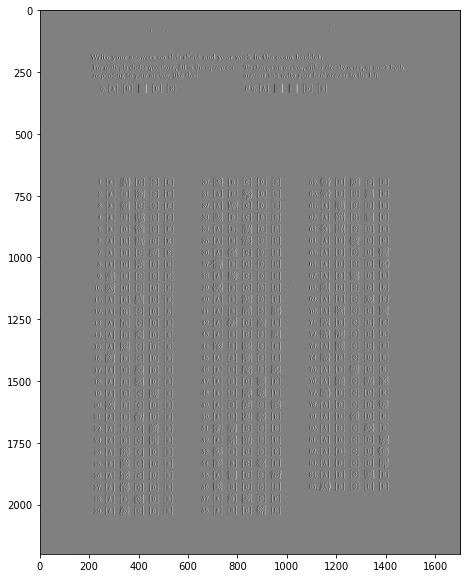

In [3]:
plt.figure(figsize=(15,10))
plt.imshow(Convolve(image, np.array([[-1,0,1],[-2,0,2],[-1,0,1]]), stride = 1), cmap='gray')

With different strides

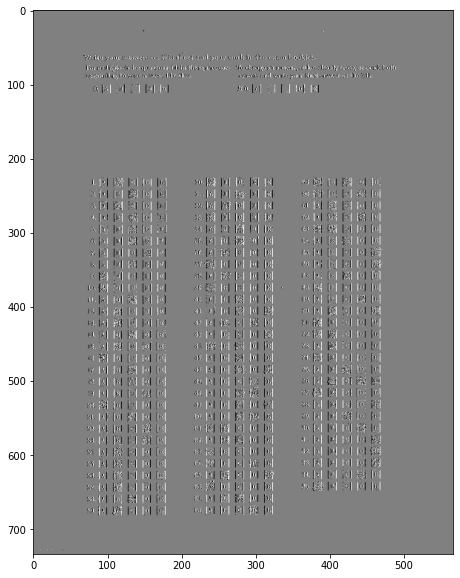

In [4]:
plt.figure(figsize=(15,10))
plt.imshow(Convolve(image, np.array([[-1,0,1],[-2,0,2],[-1,0,1]]), stride = 3), cmap='gray')

### Gaussian Smoothning

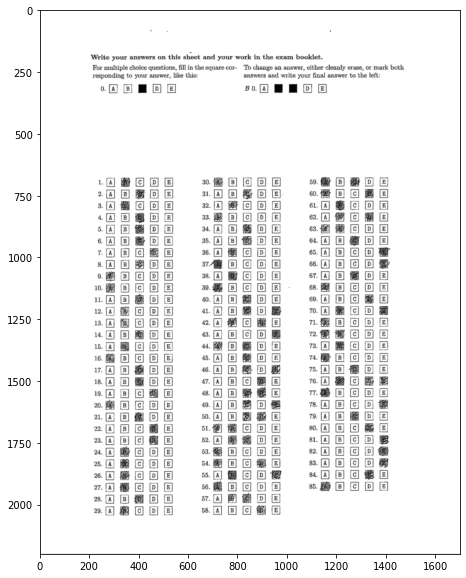

In [5]:
plt.figure(figsize=(15,10))
plt.imshow(Convolve(image, Gaussian((5, 5), 1)), cmap='gray')

### Sharpening

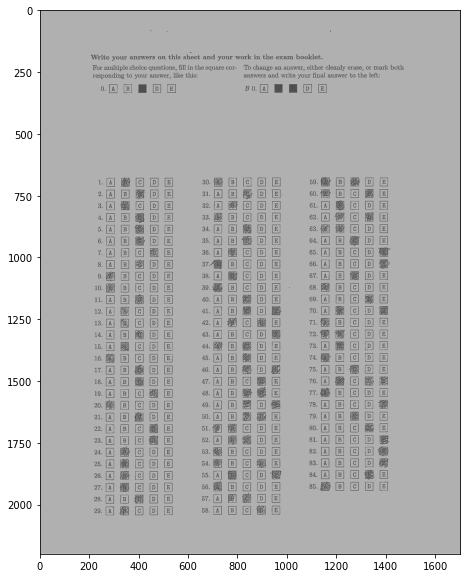

In [6]:
plt.figure(figsize=(15,10))
plt.imshow(Sharpen(image, sharpen_kernel, 1), cmap='gray')

### Sobel edge detection

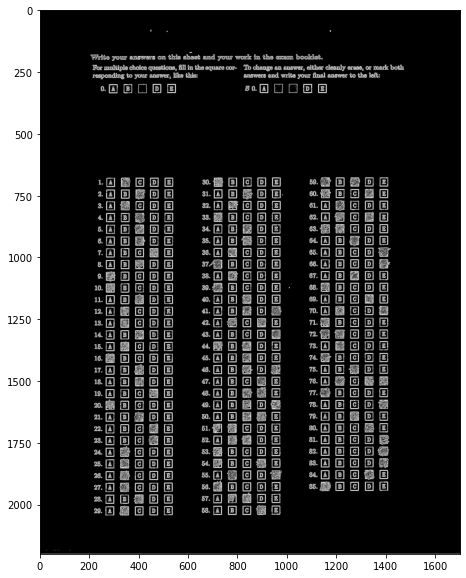

In [7]:
plt.figure(figsize=(15,10))
plt.imshow(Sobel_edge_detection(image), cmap='gray')

### Canny edge detection

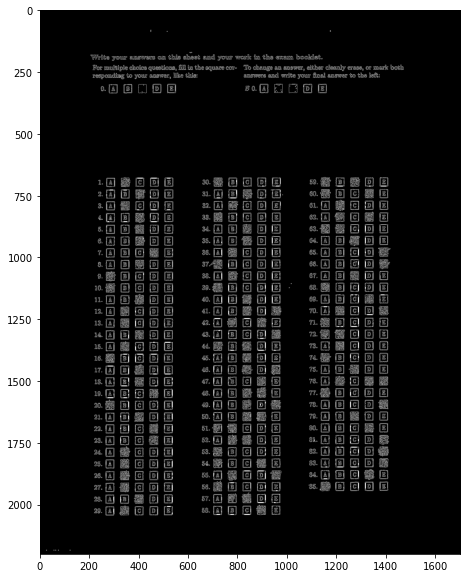

In [46]:
plt.figure(figsize=(15,10))
plt.imshow(Canny_Edge_Detection(norm_img, 75, 25), cmap = 'gray')

In [9]:
norm_img = np.abs(image - 255.)


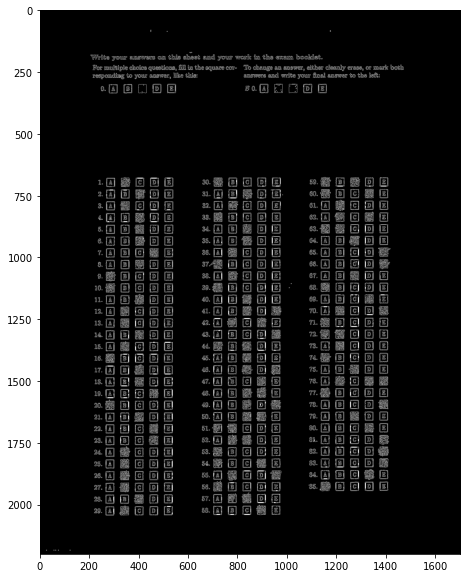

In [10]:
plt.figure(figsize=(15,10))
plt.imshow(Canny_Edge_Detection(norm_img, 50, 10), cmap='gray')

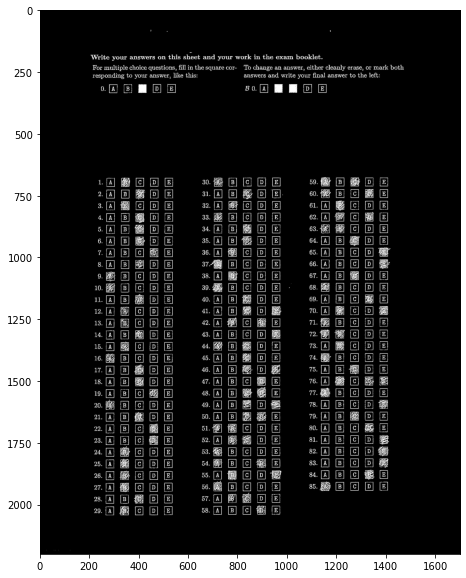

In [11]:
plt.figure(figsize=(15,10))
plt.imshow(norm_img, cmap='gray')

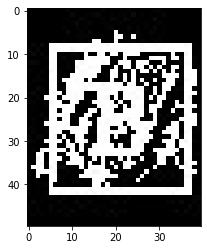

In [12]:
plt.imshow(norm_img[2000:2050,320:360], cmap='gray')

In [13]:
np.unique(norm_img[2000:2050,320:360])

array([  0.,   1.,   2.,   3.,   4.,   5.,   6.,   7.,   8.,   9.,  10.,
        11., 244., 245., 246., 247., 248., 249., 250., 251., 252., 253.,
       254., 255.], dtype=float32)

In [14]:
patch = norm_img[2000:2050,320:360]

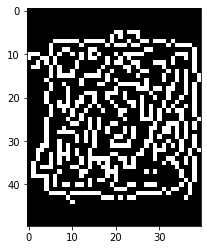

In [17]:

plt.imshow(cv2.Canny(patch.astype(np.uint8), 10, 50), cmap='gray')

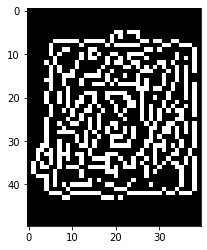

In [19]:

plt.imshow(Canny_Edge_Detection(norm_img[2000:2050,320:360], 50, 10), cmap='gray')